<h2 style="text-align:left">
Instituto Nacional de Pesquisas Espaciais, INPE <br>
Pós-Graduação em Computação Aplicada, CAP <br>



Name: Cesar Augusto de Moraes Costa

Institution: INPE.

Course: PhD in Applied Computing.

Subject: Supervised Study.

Date: 8 Oct. 2024.

# 1: Introdução: Notebook para treinamento da rede ConvLSTM. Uma "comparação" de classificação realizada com imagens de 4 tempos e bitemporal para o desastre de inundação do Rio Grande do Sul em 2024.
O modelo de Rede Neural Convolucional Temporal ConvLSTM foi utilizado com a API Keras, para classificação píxel a píxel de fragmentos de imagens de 4 tempos e bitemporais contendo inundações. Neste notebook, para treinamento e inferência do modelo, foi usado um *dataset* do desastre de inundações do Rio Grande do Sul de 2024, processados com auxílio dos dados do chamado de ativação do Charter, realizado por pesquisadores do INPE e outras Instituições do Brasil. O objetivo do projeto é analisar a arquitetura de ConvLSTM para classificar o domínio de desastre de inundações com imagens de 4 tempos e bitemporais (uma comparação), para classificar desastres em outras localidades, tendo assim respostas rápidas para auxílio emergencial da população.

## 2: Configurações iniciais

### Carregar imagens localmente


In [ ]:
# !pip install -q rasterio

In [1]:
import rasterio
from pathlib import Path
import matplotlib.pyplot as plt
import numpy as np
from osgeo import gdal

rasterio.__version__, gdal.__version__

('1.3.10', '3.9.1')

## 3: Concatenação de imagens e *pansharpening*

In [2]:
array_T1 = rasterio.open('../aulas/dados/geoinformatic_floods_paper/Sentinel2_BGRNIR_2348_20231228.tif').read()
array_T1 = np.stack([array_T1[1],
                     array_T1[2],array_T1[3]], axis=0)
array_T2 = rasterio.open('../aulas/dados/geoinformatic_floods_paper/Sentinel2_BGRNIR_2348_20240114.tif').read()
array_T2 = np.stack([array_T2[1],
                     array_T2[2],array_T2[3]], axis=0)
array_T3 = rasterio.open('../aulas/dados/geoinformatic_floods_paper/Sentinel2_BGRNIR_2348_20240203.tif').read()
array_T3 = np.stack([array_T3[1],
                     array_T3[2],array_T3[3]], axis=0)
array_T4 = rasterio.open('../aulas/dados/geoinformatic_floods_paper/Sentinel2_BGRNIR_2348_20240506.tif').read()
array_T4 = np.stack([array_T4[1],
                     array_T4[2],array_T4[3]], axis=0)

In [3]:
merge = np.concatenate((array_T4,array_T3,array_T2,array_T1), axis=0)  # axis 0 profundidade, 1 hor, 2 vert
print(merge.shape)  #GR-NIR x4

(12, 10980, 10980)


(2200, 3036, 3)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


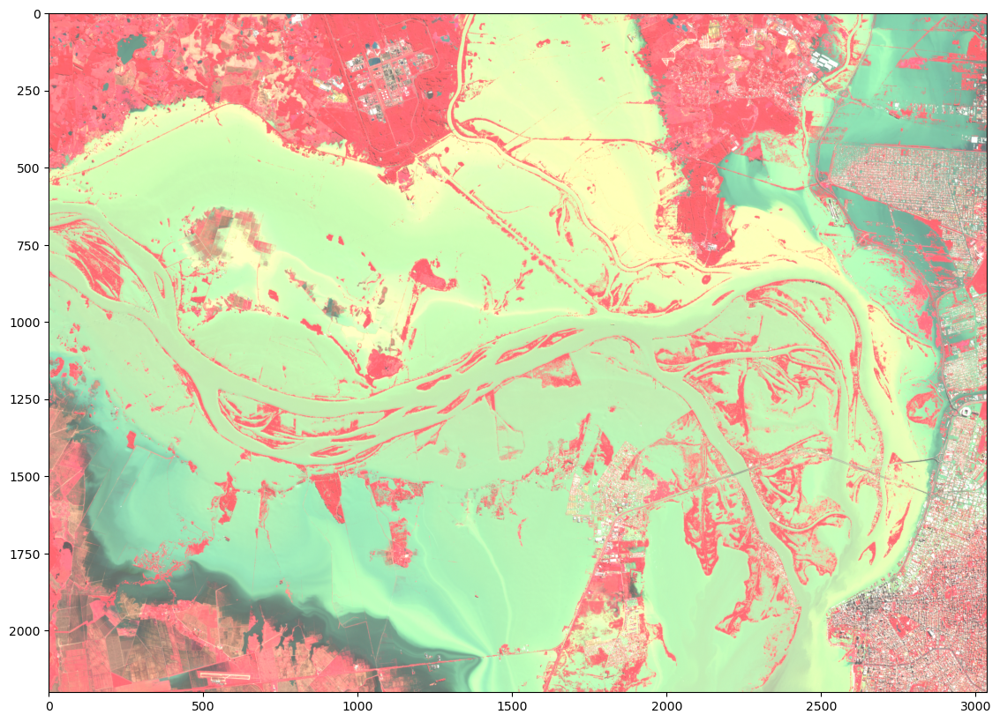

In [4]:
merge_ = merge[:,300:2500,5156:8192] 
# plt.figure(figsize=(15,10))
# plt.gray()
# plt.imshow(merge_[0,:,:]);

# Stack NIR-RG <- GR-NIR
merge_ = np.stack([merge_[2],merge_[1],
                  merge_[0]], axis=2)

print(merge_.shape)

rgbnir_t2_t1 = merge_ / merge_.max()
plt.figure(figsize=(15, 10))
plt.imshow(rgbnir_t2_t1*6)

In [5]:
#save image concatenated T4/T3/T2/T1, to create patches - GR-NIR
merge_crop = merge[:,300:2500,5156:8192]

merge.shape, merge_.shape, merge_crop.shape

((12, 10980, 10980), (2200, 3036, 3), (12, 2200, 3036))

Gerar mapa

In [6]:
##Importar biblioteca
import rasterio
from rasterio.plot import show

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


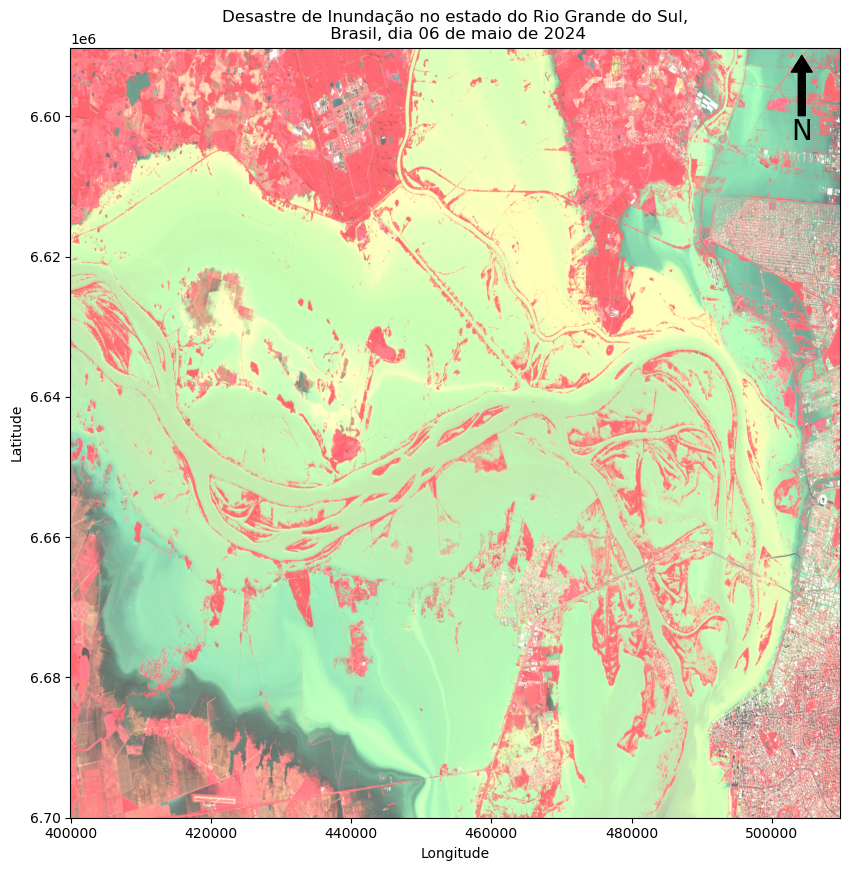

In [7]:
# Carregue a imagem raster com rasterio
path_to_raster = "../aulas/dados/geoinformatic_floods_paper/Sentinel2_BGRNIR_2348_20240506.tif"
dataset = rasterio.open(path_to_raster)

# Ler os dados e a transformação do raster
data = dataset.read(1)  # Assumindo que é uma banda de dados
transform = dataset.transform

# Obter coordenadas de latitude e longitude para as bordas do raster
min_x, min_y = transform * (0, 0)
max_x, max_y = transform * (data.shape[1], data.shape[0])

# Plotar a imagem raster usando matplotlib
fig, ax = plt.subplots(1, figsize=(15, 10))

# Plotar o raster com imshow e integração com o plt
img = ax.imshow(rgbnir_t2_t1 * 6, cmap="terrain", extent=[min_x, max_x, min_y, max_y])
# plt.colorbar(img, label="Escala")

# Personalizar rótulos e título do gráfico
plt.xlabel("Longitude")
plt.ylabel("Latitude")
plt.title("Desastre de Inundação no estado do Rio Grande do Sul,\n Brasil, dia 06 de maio de 2024")

# Inserir grids
# ax.grid(color='0.95', linestyle='dashed', linewidth=0.5, alpha=0.5)

# # Plotar box de informações
ax.text(0.5, 0.95,'',
        fontsize=12, transform=ax.transAxes, ha='center', va='center', bbox={'facecolor': 'white', 'pad': 10})

# Adicionar a orientação do norte
x, y, arrow_length = 0.95, 0.99, 0.1
ax.annotate('N', xy=(x, y), xytext=(x, y - arrow_length),
            arrowprops=dict(facecolor='black', width=5, headwidth=15),
            ha='center', va='center', fontsize=20,
            xycoords=ax.transAxes)

# Mostrar o gráfico na tela
plt.show()

In [8]:
dataset = gdal.Open("../aulas/dados/geoinformatic_floods_paper/Sentinel2_BGRNIR_2348_20240506.tif", gdal.GA_ReadOnly)
GT = dataset.GetGeoTransform()
print(GT)

(399960.0, 10.0, 0.0, 6700000.0, 0.0, -10.0)


/home/cesar/anaconda3/envs/rsgislib/lib/python3.10/site-packages/osgeo/gdal.py:312: FutureWarning: Neither gdal.UseExceptions() nor gdal.DontUseExceptions() has been explicitly called. In GDAL 4.0, exceptions will be enabled by default.
  warnings.warn(


### 3.1: Transf Affine

In [9]:
from affine import Affine

af_transf = Affine.from_gdal(*GT)
print(af_transf)

| 10.00, 0.00, 399960.00|
| 0.00,-10.00, 6700000.00|
| 0.00, 0.00, 1.00|


In [10]:
dataset = rasterio.open('../aulas/dados/geoinformatic_floods_paper/Sentinel2_BGRNIR_2348_20240506.tif')
print(dataset.profile)
dataset = rasterio.open('../aulas/dados/geoinformatic_floods_paper/Sentinel2_BGRNIR_2348_20240203.tif')
print(dataset.profile)
dataset = rasterio.open('../aulas/dados/geoinformatic_floods_paper/Sentinel2_BGRNIR_2348_20240114.tif')
print(dataset.profile)
dataset = rasterio.open('../aulas/dados/geoinformatic_floods_paper/Sentinel2_BGRNIR_2348_20231228.tif')
print(dataset.profile)
dst_crs = 'EPSG:32722'

{'driver': 'GTiff', 'dtype': 'int16', 'nodata': None, 'width': 10980, 'height': 10980, 'count': 4, 'crs': CRS.from_epsg(32722), 'transform': Affine(10.0, 0.0, 399960.0,
       0.0, -10.0, 6700000.0), 'blockysize': 1, 'tiled': False, 'interleave': 'pixel'}
{'driver': 'GTiff', 'dtype': 'uint16', 'nodata': None, 'width': 10980, 'height': 10980, 'count': 4, 'crs': CRS.from_epsg(32722), 'transform': Affine(10.0, 0.0, 399960.0,
       0.0, -10.0, 6700000.0), 'blockysize': 1, 'tiled': False, 'interleave': 'pixel'}
{'driver': 'GTiff', 'dtype': 'uint16', 'nodata': None, 'width': 10980, 'height': 10980, 'count': 4, 'crs': CRS.from_epsg(32722), 'transform': Affine(10.0, 0.0, 399960.0,
       0.0, -10.0, 6700000.0), 'blockysize': 1, 'tiled': False, 'interleave': 'pixel'}
{'driver': 'GTiff', 'dtype': 'uint16', 'nodata': None, 'width': 10980, 'height': 10980, 'count': 4, 'crs': CRS.from_epsg(32722), 'transform': Affine(10.0, 0.0, 399960.0,
       0.0, -10.0, 6700000.0), 'blockysize': 1, 'tiled': Fal

In [11]:
merge_crop.shape

(12, 2200, 3036)

In [12]:
# SAVE
with rasterio.open(
    'raster_out_concatenate_charter_4t.tif',
    'w',
    driver='GTiff',
    height=merge_crop.shape[1],
    width=merge_crop.shape[2],
    count=merge_crop.shape[0],
    dtype=np.float32,
    crs=dst_crs,
    transform=af_transf,
) as dest_file:
    dest_file.write(merge_crop)
dest_file.close()

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


(12, 2200, 3036)
(2200, 3036, 3)


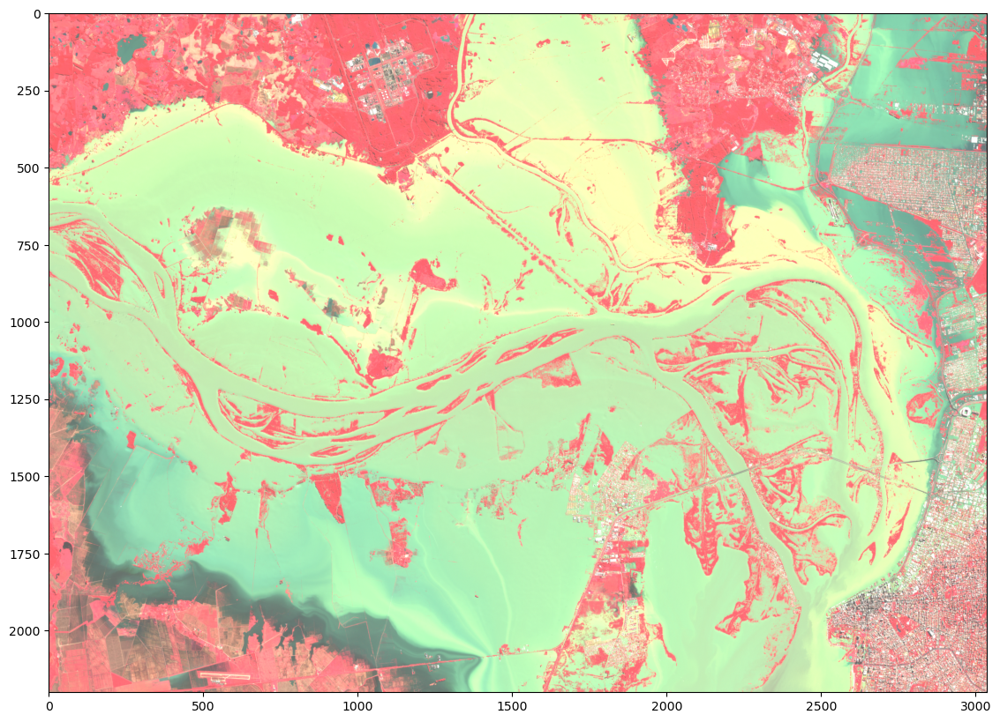

In [13]:
img_concat_array = rasterio.open('raster_out_concatenate_charter_4t.tif').read()
print(img_concat_array.shape)
# Stack NIR-RG - 12 channels
img_concat_array = np.stack([img_concat_array[2],img_concat_array[1],
                  img_concat_array[0]], axis=2)

print(img_concat_array.shape)

concat_t2_t1 = img_concat_array / img_concat_array.max()
plt.figure(figsize=(15, 10))
plt.imshow(concat_t2_t1*6)

In [14]:
dataset_concatenate = gdal.Open("raster_out_concatenate_charter_4t.tif", gdal.GA_ReadOnly)
GT_concatenate = dataset_concatenate.GetGeoTransform()
print(GT_concatenate)

(399960.0, 10.0, 0.0, 6700000.0, 0.0, -10.0)


## 3.2 : Patches de rótulos 64 x 64.

(1, 2200, 3036)

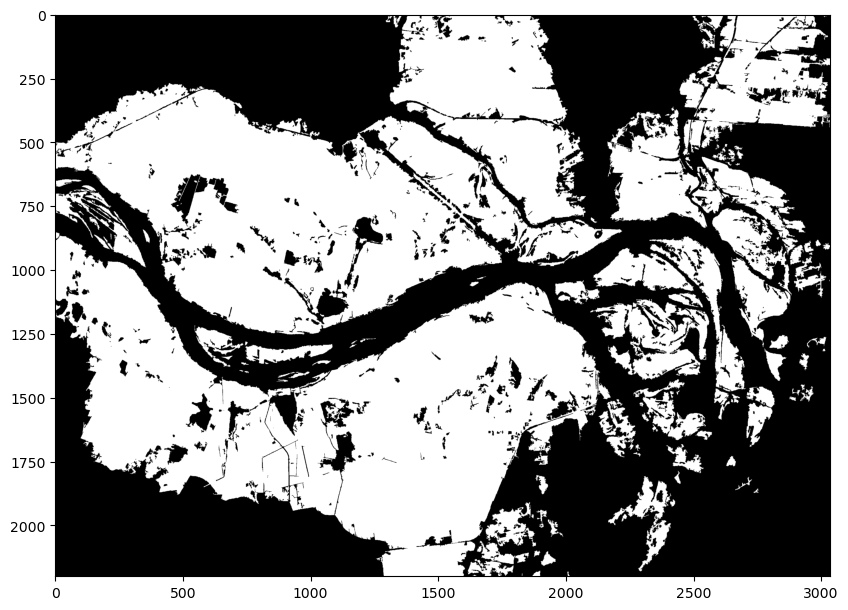

In [15]:
img = rasterio.open('../aulas/dados/geoinformatic_floods_paper/Sentinel2_classes.tif').read()
img_crop = img[:,300:2500,5156:8192] ##[:,300:2500,5156:8192] <-melhor balanceado #img_crop = img[:,10:3000,5000:8400] 
plt.figure(figsize=(10, 10))
plt.imshow(img_crop[0,:,:], cmap='gray');
img_crop.shape

### Pixels com inundação e com não inundação

In [16]:
import numpy as np

# Contar quantos pixels são 0 e quantos são 1
num_zeros = np.count_nonzero(img_crop == 0)
num_ones = np.count_nonzero(img_crop == 1)

# Exibir os resultados
print(f'Número de pixels com valor 0 (não inundação): {num_zeros}')
print(f'Número de pixels com valor 1 (inundação): {num_ones}')

Número de pixels com valor 0 (não inundação): 3339383
Número de pixels com valor 1 (inundação): 3339817


In [17]:
img_crop.shape, num_zeros+num_ones, img_crop.shape[1]*img_crop.shape[2] #todos os pixels 0s e 1s, largura x altura

((1, 2200, 3036), 6679200, 6679200)

In [18]:
# SAVE
with rasterio.open(
    'floods_classes.tif',
    'w',
    driver='GTiff',
    height=img_crop.shape[1],
    width=img_crop.shape[2],
    count=img_crop.shape[0],
    dtype=np.float32,
    crs=dst_crs,
    transform=af_transf,
) as dest_file:
    dest_file.write(img_crop)
dest_file.close()

In [19]:
dataset_concatenate = gdal.Open("floods_classes.tif", gdal.GA_ReadOnly)
GT_concatenate = dataset_concatenate.GetGeoTransform()
print(GT_concatenate)

(399960.0, 10.0, 0.0, 6700000.0, 0.0, -10.0)


(1, 2200, 3036)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


(2200, 3036, 4)


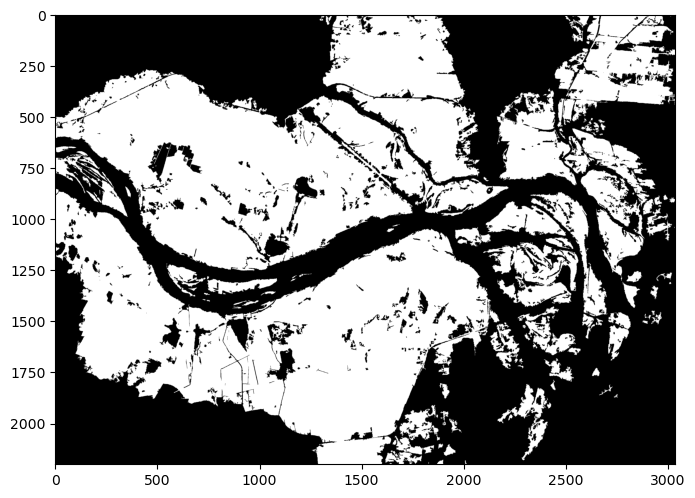

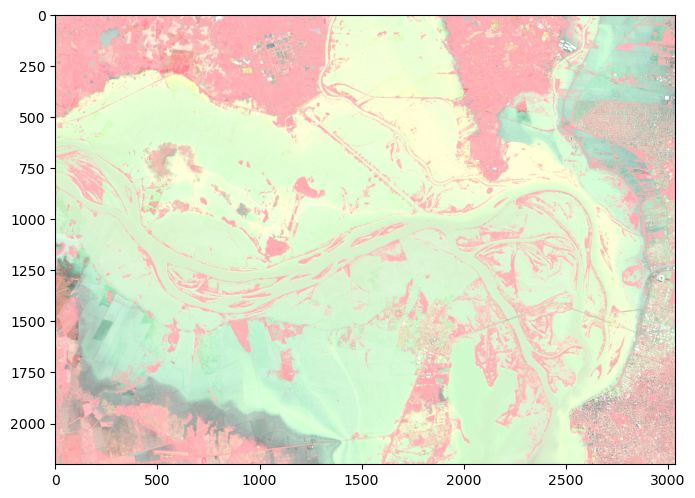

In [20]:
img = rasterio.open('floods_classes.tif').read()
plt.figure(figsize=(8, 8))
plt.imshow(img[0,:,:], cmap='gray')
print(img.shape)

img_concat_array = rasterio.open('raster_out_concatenate_charter_4t.tif').read()
# Stack RGB NIR - 16 channels
img_concat_array = np.stack([img_concat_array[2],img_concat_array[1],
                  img_concat_array[0],img_concat_array[3]], axis=2)

print(img_concat_array.shape)

concat_t2_t1 = img_concat_array / img_concat_array.max()
plt.figure(figsize=(8, 8))
plt.imshow(concat_t2_t1*6)

## 3.3: Patches com Systematic [3].

In [1]:
from osgeo import gdal
def systematic(tif_path, pixelX=None, pixelY=None, tamX=None,
                    tamY=None, sobras=False):
    """
    Função para criação de patches conforme parâmetros escolhidos pelo usuário.

    patch_generator(tif_path, pixelX=None, pixelY=None, tamX=None,
                    tamY=None, sobras = False)


    tif_path: Deve ser inserida uma string com o
    diretório onde a imagem raster está inserida.
    ex: '/content/crop_rapideye.tif'


    pixelX: Deve ser inserido um valor inteiro com
    a dimensão desejada para o eixo X do patche.
    (Dimensão X do Patche em pixels)
    ex: 300

    pixelY: Deve ser inserido um valor inteiro com
    a dimensão desejada para o eixo Y do patche.
    (Dimensão Y do Patche em pixels)
    ex: 300

    tamX: Deve ser inserido um valor inteiro, em metros, da
    dimensão desejada para o eixo X do patche.
    (Dimensão X do Patche em metros)
    ex: 1500

    tamY: Deve ser inserido um valor inteiro, em metros, da
    dimensão desejada para o eixo Y do patche
    (Dimensão Y do Patche em metros)
    ex: 1500

    sobras: Quando True irá gerar recortes das bordas, caso estas
    apresentem dimensões inferiores às inseridas pelo usuário


    Exemplo de aplicação:
    Por exemplo, inserindo os seguintes parâmetros...

    patch_generator('/content/crop_rapideye.tif', pixelX=300, pixelY=300)

    Serão criados patches de 300x300 pixels do raster
    crop_rapideye.tif
    """

    raster = gdal.Open(tif_path)

    # Coletando os dados do raster
    gt = raster.GetGeoTransform()
    name = raster.GetDescription()
    name = name.split('.')[-2]

    # Separando os valores da lista gt
    # Coleta da coordenada x do canto superior esquerdo
    img_xmin = gt[0]
    # Coleta da coordenada y do canto superior esquerdo
    img_ymax = gt[3]
    # Coleta da resolução da imagem
    res = gt[1]

    # Verificandoo tamanho da imagem nos eixos x e y.
    # n_pixelsx é o numero de pixels na dimensão x
    # n_pixelsy é o numero de pixels na dimensão y
    n_pixelsx = raster.RasterXSize
    n_pixelsy = raster.RasterYSize

    # img_xlen é tamanho da imagem em metros na dimensão x
    # img_ylen é tamanho da imagem em metros na dimensão y
    img_xlen = res * n_pixelsx
    img_ylen = res * n_pixelsy


    # Delimitando o tamanho do patch

    # Caso o usuário insera o valor das dimensões do patch em pixels
    if pixelX != None and pixelY != None:
        # tamanho do patch em metros
        patch_xlen = pixelX * res
        patch_ylen = pixelY * res
        print(f'Tamanho do patch: {patch_xlen}m x {patch_ylen}m')

    # Caso o usuário insira o valor das dimensões do patch em metros
    elif  tamX != None and tamY != None:
        patch_xlen = tamX
        patch_ylen = tamY

    # Verificação do número de patches por eixo (dimensão total da imagem no eixo x // dimensão do patch em metros no eixo x)
    xdiv = img_xlen//patch_xlen
    # Verificação do número de patches por eixo (dimensão total da imagem no eixo y // dimensão do patch em metros no eixo y)
    ydiv = img_ylen//patch_ylen

    # Verificação do número total de patches
    total_patches= xdiv*ydiv
    print(f'Número total de patches ({pixelX} x {pixelY}) criados: {total_patches}')

    # Testando se o tamanho da imagem é proporcional ao tamanho do patch nas duas dimensões
    # Verificando se o tamanho do patch inserido pelo usuário é múltiplo da dimensão da imagem tif

    if img_xlen % patch_xlen != 0 or img_ylen % patch_ylen !=0:
        print(f'O tamanho da imagem não é múltiplo do tamanho do patch.\n')

       # Se o valor na dimensão x ou y não for divisível pela dimensão total da imagem, será aumentado
       # um valor no número de sobras
        if sobras:
            if img_xlen % patch_xlen != 0:
                xdiv += 1
            elif img_ylen % patch_ylen !=0:
                ydiv += 1
                t_patches= xdiv*ydiv
            print(f'Número total de patches a serem criados (+ sobras): {total_patches} patches + {t_patches - total_patches} sobras')

    # img_xmin = coord_x canto superior esquerdo; img_ymax = coord_y canto superior esquerdo;

    # Criação de uma lista com as coordenadas em x, através de uma list comprehension
    # com step de 0 até o número total de patches no eixo x(xdiv)
    xsteps = [img_xmin + patch_xlen*i for i in range(int(xdiv)+1)]

    # Criação de uma lista com as coordenadas em y, através de uma list comprehension
    # com step de 0 até o número total de patches no eixo y(xdiv)
    ysteps = [img_ymax - patch_ylen*i for i in range(int(ydiv)+1)]

    # Pergunta para o usuário, verificando se ele realmente quer fazer o número de patches
    # Esse passo é para evitar a criação de números demasiados de patches devido erro de digitação
    resp = 'S'  # input(f'Dejesa criar {total_patches} patches? (S/N)')

    # Se a respota for Sim (S), os patches serão criados
    if resp.upper() == 'S':
        # id = número inicial do nome atribuído a cada um dos patches, começando pelo 1
        id = 1
        # Criação de dois for aninhado para a definição das coordenadas de recorte
        for i in range(int(xdiv)):
            for j in range(int(ydiv)):
                # Coordenadas x (max/min) para o recorte, extraídas da lista de coordenadas criadas anteriormente (xsteps)
                xmin = xsteps[i]
                xmax = xsteps[i+1]
                # Coordenadas y (max/min) para o recorte, extraídas da lista de coordenadas criadas anteriormente (ysteps)
                ymax = ysteps[j]
                ymin = ysteps[j+1]

                gdal.Warp(name + '_' + 'p' + str(id) +'.tif', raster, outputBounds = (xmin, ymin, xmax, ymax), dstNodata = -9999)
                id += 1
        print(f'>> {total_patches} patches criados!')

    # Caso a resposta seja não (n), o programa não irá criar os patches
    elif resp.upper() == 'N':
        print('Programa finalizado, você optou por não criar nenhum patche.')
        print('-' * 100)

In [23]:
systematic('raster_out_concatenate_charter_4t.tif', pixelX=64, pixelY=64, sobras=False)

Tamanho do patch: 640.0m x 640.0m
Número total de patches (64 x 64) criados: 1598.0
O tamanho da imagem não é múltiplo do tamanho do patch.

>> 1598.0 patches criados!


In [24]:
!rm -rf patches_charter

In [25]:
# CRIA DIRETÓRIO E MOVE PATCHES PARA LÁ
!mkdir patches_charter
!mkdir patches_charter/cenas
!mv raster_out_concatenate_charter_4t_p*.tif patches_charter/cenas

In [26]:
systematic('floods_classes.tif', pixelX=64, pixelY=64, sobras=False)

Tamanho do patch: 640.0m x 640.0m
Número total de patches (64 x 64) criados: 1598.0
O tamanho da imagem não é múltiplo do tamanho do patch.

>> 1598.0 patches criados!


In [27]:
# CRIA DIRETÓRIO E MOVE PATCHES PARA LÁ
!mkdir patches_charter/classes
!mv floods_classes_p*.tif patches_charter/classes

## 3.4: Leitura e visualização dos dados

### 3.4.1: Bibliotecas necessárias
<hr style="border:1px solid #7D26CD">

In [1]:
import os
import glob
# Dados
import imgaug as ia
import imgaug.augmenters as iaa
import random
import PIL
from PIL import Image
from PIL import ImageOps

# Leitura das imagens
from skimage import io

import numpy as np
import time

import pandas as pd
from tensorflow.keras.preprocessing import image

# Machine Learning
import tensorflow as tf
from tensorflow import keras
from sklearn.metrics import f1_score, classification_report, accuracy_score, confusion_matrix
# Gráficos
import matplotlib.pyplot as plt
import random
from imageio import mimread

tf.__version__

2024-11-20 17:07:51.979999: I tensorflow/core/util/port.cc:153] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2024-11-20 17:07:51.990541: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:485] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-11-20 17:07:52.001002: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:8454] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-11-20 17:07:52.004086: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1452] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2024-11-20 17:07:52.012484: I tensorflow/core/platform/cpu_feature_guar

'2.17.0'

In [2]:
seed = 42
np.random.seed = seed
random.seed = seed
tf.random.set_seed(42)

In [3]:

sentinel2 = ['patches_charter/cenas',
          'patches_charter/classes']

# Função para leitura dos files
def read_image(image_path, mask=False):
    # Recebe os caminhos dos files
    img = io.imread(image_path)

    # Se for label a variável img receberá ela mesma
    if mask:
        # A imagem recebe apenas imagem
        img = img
    # Caso contrário,
    else:
        # se for patch o valores dos pixels é divido por 255
        img = img/255
    # A função retorna a imagem
    return img
# Organização da lista de rasters
# Lista: armazenará os paths de cada patch
org_path_pacth1 = []

# Loop: Acessa o diretório [0] para ler o paths
for raster in glob.iglob(sentinel2[0]+'/*.tif'):
    # Armazena o paths na lista
    org_path_pacth1.append(raster)
# Ordena os strings dos paths
org_path_pacth1.sort()

# Organização da lista de labels
#Lista: armazenará os paths de cada patch
org_path_label1 = []
# Loop: Acessa o diretório [1] para ler o paths
for raster in glob.iglob(sentinel2[1]+'/*.tif'):
    # Armazena o paths na lista
    org_path_label1.append(raster)
# Ordena os strings dos paths
org_path_label1.sort()
# Leitura e armazenamentos dos raster
# Lista: Armazenará as imagens
patche = []

# Loop: acessa cada path
for i in org_path_pacth1:
    # Leitura: chama a função de leitura
    imagem = read_image(i)
    # Armazena patches na lista
    patche.append(imagem)

# Leitura e armazenamentos dos labels
# Lista: Armazenará as imagens
label = []
# Loop: acessa cada path
for i in org_path_label1:
    # Leitura: chama a função de leitura
    mask = read_image(i, mask=True)

    new_mask = np.where(mask > 0, mask, 0)

    # Armazena labels na lista
    label.append(new_mask)

In [4]:
len(patche), len(label)

(1598, 1598)

In [5]:
# 40%  para teste e 60% para treinamento 
patche_cena_ = np.array(patche)
patche_classe_ = np.array(label)
len_patches_test = int(len(patche_classe_) * 0.6)  
print(len_patches_test)
# teste separado 40%
patche_cena_test = patche_cena_[len_patches_test:]
patche_classe_test = patche_classe_[len_patches_test:]
print('Ds para teste: ', patche_classe_test.shape)

patche_cena = patche_cena_[:len_patches_test]
patche_classe = patche_classe_[:len_patches_test]
print('Ds para treinamento: ', patche_classe.shape)

958
Ds para teste:  (640, 64, 64)
Ds para treinamento:  (958, 64, 64)


In [6]:
# variáveis para contar inundações e não inundações
floods = 0
no_floods = 0

for i in range(len(patche_classe_)):

  classe = patche_classe_[i]
  # print(classe)
  # Verifica valor diferente de 0 na matriz para inundações
  if np.any(classe != 0):
    floods += 1
  else:
    no_floods += 1
#quantidade de inundações e não inundações
print(f'Dataset original \nNúmeros de inundações: {floods}; Número de não-inundações: {no_floods}.')

Dataset original 
Números de inundações: 1228; Número de não-inundações: 370.


### 3.4.3: Visualizar patches das cenas e classes

In [8]:
# patche_cena_reshape = patche_cena.reshape(1860,64,64,16)
# print(patche_cena.shape, patche_cena_reshape.shape)
patche_cena.shape, patche_classe.shape # ((958, 64, 64, 12), (958, 64, 64)) - quantidade, largura, altura, canais(4 tempos * 3 bandas)

((958, 64, 64, 12), (958, 64, 64))

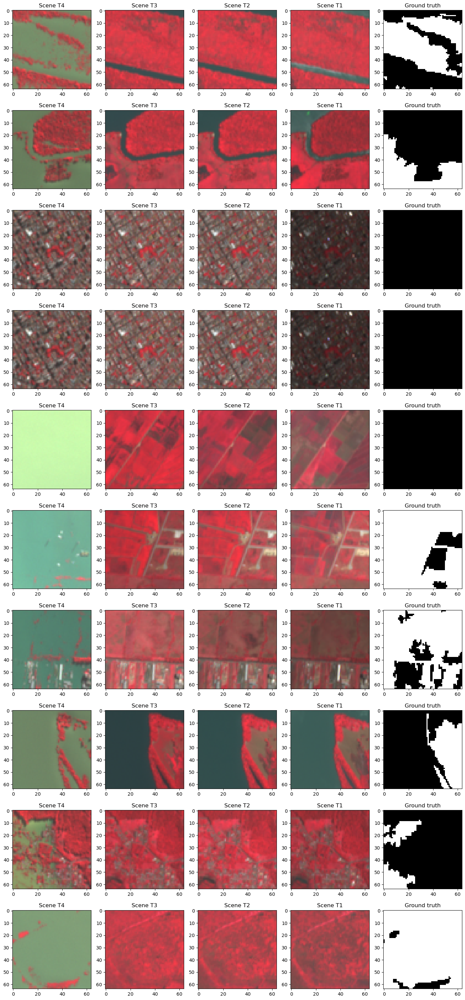

In [9]:
import matplotlib.pyplot as plt
import numpy as np


# Função para visualização das imagens
def visualize_images(num_rows, random_indices):
    fig, axes = plt.subplots(num_rows, 5, figsize=(14, 3*num_rows))

    for i in range(num_rows):
        idx = random_indices[i]

        # # Stack BGR NIR to RGB NIR - 16 channels -> 4 channels
        image_rgb_t1 = np.stack([patche_cena[idx, :, :, 11], patche_cena[idx, :, :, 10],
                                 patche_cena[idx, :, :, 9]], axis=2)
        
        image_rgb_t2 = np.stack([patche_cena[idx, :, :, 8], patche_cena[idx, :, :, 7],
                                 patche_cena[idx, :, :, 6]], axis=2)

        image_rgb_t3 = np.stack([patche_cena[idx, :, :, 5], patche_cena[idx, :, :, 4],
                                 patche_cena[idx, :, :, 3]], axis=2)

        image_rgb_t4 = np.stack([patche_cena[idx, :, :, 2], patche_cena[idx, :, :, 1],
                                 patche_cena[idx, :, :, 0]], axis=2)

        # Normalização das imagens NIR-RG
        image_rgb_t1 = image_rgb_t1 / image_rgb_t1.max()
        image_rgb_t2 = image_rgb_t2 / image_rgb_t2.max()
        image_rgb_t3 = image_rgb_t3 / image_rgb_t3.max()
        image_rgb_t4 = image_rgb_t4 / image_rgb_t4.max()

        # Predições
        ground_truth = np.squeeze(patche_classe[idx])

        # Plotar as imagens
        axes[i, 0].imshow(image_rgb_t4, cmap='gray')
        axes[i, 0].set_title('Scene T4')
        # axes[i, 0].axis('off')

        axes[i, 1].imshow(image_rgb_t3, cmap='gray')
        axes[i, 1].set_title('Scene T3')
        # axes[i, 1].axis('off')

        axes[i, 2].imshow(image_rgb_t2, cmap='gray')
        axes[i, 2].set_title('Scene T2')
        # axes[i, 0].axis('off')

        axes[i, 3].imshow(image_rgb_t1, cmap='gray')
        axes[i, 3].set_title('Scene T1')
        # axes[i, 0].axis('off')

        axes[i, 4].imshow(ground_truth, cmap='gray')
        axes[i, 4].set_title('Ground truth')
        # axes[i, 2].axis('off')


    plt.tight_layout()
    plt.show()

# Escolha aleatoriamente algumas imagens para visualizar
num_samples = 10
random_indices = np.random.randint(0, patche_cena.shape[0], num_samples)

# Visualizar as cenas e as classes lado a lado
visualize_images(num_samples, random_indices)


## 4: Tensorflow Keras
## Introdução
### Modelo ConvLSTM utilizando a API Keras para classificação pixel a pixel de patches de imagens tempotais de inundações da catástrofe do Rio Grande do Sul em 2024. A ideia desse projeto foi utilizar a arquitetura ConvLSTM, usada no contexto de séries temporais, aplicada neste estudo para o domínio de desastre de inundação.
<hr style="border:1px solid #7D26CD">

In [7]:
patche_cena.shape, patche_classe.shape  # ((958, 64, 64, 12), (958, 64, 64))

((958, 64, 64, 12), (958, 64, 64))

In [8]:
# variáveis para contar inundações e não inundações - treinamento (patche_classe)
floods = 0
no_floods = 0
# Listas de inundações e não-inundações dataset original
list_patches = []
list_patches_n = []
# laço de contagem
for i in range(len(patche_classe)): 

  # print(patche_classe[i])
  # Verifica valor diferente de -1 na matriz para deslizamento
  if np.any(patche_classe[i] >= 1):
    floods += 1
    list_patches.append(i)
  else:
    no_floods += 1
    list_patches_n.append(i)
#quantidade de inundações e não inundações
print('Treinamento')
print(f'Números de inundações: {floods}; Número de não-inundações: {no_floods}.')
print(f'Listas: \ninundações: {list_patches};\nNão-inundações: {list_patches_n}.')

Treinamento
Números de inundações: 681; Número de não-inundações: 277.
Listas: 
inundações: [1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 25, 27, 28, 29, 30, 31, 32, 33, 34, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 58, 59, 60, 61, 62, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 97, 101, 108, 109, 110, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 129, 130, 135, 146, 147, 148, 149, 152, 153, 154, 155, 156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168, 172, 173, 179, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192, 193, 194, 195, 196, 197, 198, 199, 201, 202, 203, 204, 205, 206, 209, 210, 212, 220, 221, 222, 223, 224, 225, 226, 227, 228, 230, 231, 232, 233, 234, 235, 236, 237, 238, 239, 240, 241, 242, 243, 244, 245, 246, 247, 248, 251, 257, 258, 259, 260, 261, 262, 263, 264, 265, 266, 267, 268, 269, 270, 271, 272, 273, 274

In [9]:
# variáveis para contar inundações e não inundações - treinamento (patche_classe_test)
floods = 0
no_floods = 0
# Listas de inundações e não-inundações dataset original
list_patches = []
list_patches_n = []
# laço de contagem
for i in range(len(patche_classe_test)): 

  # print(patche_classe_test[i])
  # Verifica valor diferente de -1 na matriz para deslizamento
  if np.any(patche_classe_test[i] >= 1):
    floods += 1
    list_patches.append(i)
  else:
    no_floods += 1
    list_patches_n.append(i)
#quantidade de inundações e não inundações
print('Teste')

print(f'Números de inundações: {floods}; Número de não-inundações: {no_floods}.')
print(f'Listas: \ninundações: {list_patches};\nNão-inundações: {list_patches_n}.')

Teste
Números de inundações: 547; Número de não-inundações: 93.
Listas: 
inundações: [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 19, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 63, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 86, 87, 88, 89, 90, 91, 92, 93, 94, 97, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 129, 130, 131, 132, 141, 144, 145, 146, 147, 148, 149, 150, 151, 152, 153, 154, 155, 156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168, 169, 174, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192, 193, 194, 197, 198, 199, 200, 201, 202, 203, 204, 205, 206, 207, 208, 209, 220, 221, 222, 223, 224, 225, 226, 227, 228, 229, 231, 232, 233, 234, 235, 236, 237, 238, 239, 240, 242, 243, 244, 245, 246, 247, 249, 256, 257, 258, 259, 260, 261, 262, 264, 265, 266, 267, 268, 269, 270, 271,

## 5: Construção da rede neural

#### 5.1.1: Função de perda de entropia cruzada. Função de perda substituta (Surrogate Loss Functions).
##### É usada quando houver duas ou mais classes de rótulos. Esperando que os rótulos sejam fornecidos como ```números inteiros```. Se você quiser fornecer rótulos usando representação one-hot (propenso a criar muitos preditores), use CategoricalCrossentropy loss. Deve haver \# classes valores de ponto flutuante por recurso para y_pred e um único valor de ponto flutuante por recurso para y_true [4].

## 6: Treinamento com validação de 20%

In [10]:
# len(np.unique(train_label))
np.unique(patche_classe)  # salvando aumento de dados com dtype=uint8

array([0., 1.], dtype=float32)

In [11]:
patche_classe.shape,patche_cena.shape

((958, 64, 64), (958, 64, 64, 12))

In [12]:
# Reshape patche_cena
patche_cena_reshape = patche_cena.reshape(patche_cena.shape[0],patche_cena.shape[1],patche_cena.shape[2],patche_cena.shape[3])
patche_cena_reshape.shape  # (1860, 64, 64, 12)

(958, 64, 64, 12)

In [13]:
def criar_diretorio(caminho):
  if not os.path.exists(caminho):
    os.makedirs(caminho)
path_modelo = 'modelos'
criar_diretorio(path_modelo)

In [14]:
from tensorflow.keras.callbacks import ModelCheckpoint, EarlyStopping, TensorBoard, ReduceLROnPlateau, CSVLogger
import os

In [15]:
from tensorflow.keras.backend import clear_session

# Limpar a sessão atual do Keras
clear_session()


In [16]:
import tensorflow as tf
from tensorflow.keras import backend as K

# Fechar a sessão do TensorFlow
K.clear_session()

# Resetar a memória da GPU
tf.config.experimental.reset_memory_stats('GPU:0')


I0000 00:00:1732133298.433823  104780 cuda_executor.cc:1015] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
I0000 00:00:1732133298.485007  104780 cuda_executor.cc:1015] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
I0000 00:00:1732133298.488252  104780 cuda_executor.cc:1015] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
I0000 00:00:1732133298.491294  104780 cuda_executor.cc:1015] successful NUMA node read from SysFS ha

In [17]:
import tensorflow as tf
import keras
from keras import layers
from keras import optimizers
from keras.regularizers import l2
from keras.layers import Input, Dense, Activation, BatchNormalization, Dropout, Flatten, Lambda, SpatialDropout1D, Concatenate, Conv3D
from keras.layers import Conv1D, Conv2D, AveragePooling1D, MaxPooling1D, GlobalMaxPooling1D, GlobalAveragePooling1D, GRU, Bidirectional
from keras.callbacks import Callback, ModelCheckpoint, History, EarlyStopping
from keras.models import Model, load_model
from keras.utils import to_categorical
from keras import backend as K
import time
import numpy as np

In [18]:
def iou_metric(y_true, y_pred):
    # Caso y_pred esteja em formato de probabilidade, convertemos para rótulos de classe
    if y_pred.shape[-1] > 1:
        y_pred = tf.argmax(y_pred, axis=-1)
        y_pred = tf.expand_dims(y_pred, axis=-1)  # Expandir para corresponder a y_true

    if y_true.shape[-1] > 1:
        y_true = tf.argmax(y_true, axis=-1)
        y_true = tf.expand_dims(y_true, axis=-1)  # Expandir para corresponder a y_pred

    y_true = tf.cast(y_true, tf.int64)
    y_pred = tf.cast(y_pred, tf.int64)

    # Calcular interseção e união
    intersection = tf.reduce_sum(tf.cast(tf.logical_and(tf.equal(y_true, 1), tf.equal(y_pred, 1)), tf.float32))
    union = tf.reduce_sum(tf.cast(tf.logical_or(tf.equal(y_true, 1), tf.equal(y_pred, 1)), tf.float32))

    return intersection / (union + tf.keras.backend.epsilon())

tf.keras.utils.get_custom_objects().update({"iou_metric": iou_metric})

In [19]:
import numpy as np
from tensorflow.keras.utils import to_categorical


def one_hot_encode_labels(labels, num_classes):
    return to_categorical(labels, num_classes)

def reshape_data(X, target_channels):
    """
    Reorganiza os dados para a forma desejada com base no número de canais.
    """
    # Verifique a forma atual
    n_samples = X.shape[0]
    height = X.shape[1]
    width = X.shape[2]
    current_channels = X.shape[3]

    # Verifique se o número de canais especificado é compatível
    if current_channels != target_channels:
        raise ValueError("O número de canais especificado não é compatível com a forma dos dados.")

    # Adicione uma dimensão de tempo fictícia se necessário (por exemplo, para uma rede com dimensão temporal)
    return X.reshape(n_samples, 1, height, width, current_channels)  # Adiciona uma dimensão de tempo


In [20]:
import numpy as np
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import ConvLSTM2D, BatchNormalization, Conv2D
from tensorflow.keras.utils import to_categorical

# Função para one-hot encoding
def one_hot_encode_labels(labels, num_classes):
    return to_categorical(labels, num_classes)

# Dimensões
nbclasses = 2  # Número de classes
n_bands = 12
l_patche = 64
input_shape = (1, l_patche, l_patche, n_bands)  # Ajuste conforme necessário

# One-hot encoding das labels
y_train_onehot = one_hot_encode_labels(patche_classe, nbclasses)
print('Forma de y_train após onehot:', y_train_onehot.shape)

# Aplicar a função
X_train_reshaped = reshape_data(patche_cena_reshape, n_bands)
print('Forma de X_train após reshape:', X_train_reshaped.shape)

# Definir o modelo ConvLSTM
def build_conv_lstm_classification_model(input_shape):
    model = Sequential()
    
    # Primeira camada ConvLSTM
    model.add(ConvLSTM2D(filters=64, kernel_size=(3, 3), input_shape=input_shape, padding='same', return_sequences=True))
    model.add(BatchNormalization())
    
    # Segunda camada ConvLSTM
    model.add(ConvLSTM2D(filters=64, kernel_size=(3, 3), padding='same', return_sequences=False))
    model.add(BatchNormalization())
    
    # Camada Conv2D para reduzir para 2 canais (multiclasse por pixel)
    model.add(Conv2D(filters=2, kernel_size=(1, 1), activation='softmax', padding='same'))  # softmax para multiclass
    
    model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy', iou_metric])
    return model

# Criar o modelo
model_conv_lstm_classification = build_conv_lstm_classification_model(input_shape)
model_conv_lstm_classification.summary()

# Treinamento
X_train = X_train_reshaped  # (958, 1, 64, 64, 12)
y_train = y_train_onehot  # (958, 64, 64, 2)

print("X_train shape:", X_train.shape)  # Deve ser (958, 1, 64, 64, 12)
print("y_train shape:", y_train.shape)  # Deve ser (958, 64, 64, 2)


Forma de y_train após onehot: (958, 64, 64, 2)
Forma de X_train após reshape: (958, 1, 64, 64, 12)


/home/cesar/anaconda3/envs/rsgislib/lib/python3.10/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv_lstm2d (ConvLSTM2D)        │ (None, 1, 64, 64, 64)  │       175,360 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization             │ (None, 1, 64, 64, 64)  │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv_lstm2d_1 (ConvLSTM2D)      │ (None, 64, 64, 64)     │       295,168 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_1           │ (None, 64, 64, 64)     │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d (Conv2D)                 │ (None, 64, 64, 2)      │           130 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 471,170 (1.80 MB)

 Trainable params: 470,914 (1.80 MB)

 Non-trainable params: 256 (1.00 KB)

X_train shape: (958, 1, 64, 64, 12)
y_train shape: (958, 64, 64, 2)


### Cross Validation

In [24]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.model_selection import TimeSeriesSplit
from keras.callbacks import ModelCheckpoint, EarlyStopping
from keras import backend as K

# Configuração
num_folds = 5
# Dimensões
nbclasses = 2  # Número de classes
n_bands = 12
l_patche = 64
input_shape = (1, l_patche, l_patche, n_bands)

# Função para preparar os dados
def preparar_dados(patche_cena, patche_classe, num_classes):
    y_onehot = one_hot_encode_labels(patche_classe, num_classes)
    X_reshaped = reshape_data(patche_cena, n_bands)
    return X_reshaped, y_onehot

# TimeSeriesSplit
tscv = TimeSeriesSplit(n_splits=num_folds)

# Armazenar resultados
all_scores = []
histories = []

# K-Fold Cross-Validation
for fold, (train_index, val_index) in enumerate(tscv.split(patche_cena_reshape)):
    print(f'Fold {fold+1}/{num_folds}')

    X_train, X_val = patche_cena_reshape[train_index], patche_cena_reshape[val_index]
    y_train, y_val = patche_classe[train_index], patche_classe[val_index]
    print(X_train.shape, y_train.shape, X_val.shape, y_val.shape)

    # Preparar os dados
    X_train_reshaped, y_train_onehot = preparar_dados(X_train, y_train, nbclasses)
    X_val_reshaped, y_val_onehot = preparar_dados(X_val, y_val, nbclasses)
    print(X_train_reshaped.shape, y_train_onehot.shape, X_val_reshaped.shape, y_val_onehot.shape)
    
    # # Treinamento
    # X_train = patche_cena_reshape  # (958, 4, 64, 64, 3)
    # y_train = np.expand_dims(patche_classe, axis=-1)  # Adiciona uma dimensão para ajustar a saída (958, 64, 64, 1)


    # Criar e compilar o modelo
    model = build_conv_lstm_classification_model(input_shape)
    model.compile(optimizer='adam',
                  loss='categorical_crossentropy',
                  metrics=['accuracy', iou_metric])

    # Definir callbacks
    callbacks = [
        EarlyStopping(monitor='val_loss', patience=10),
        ModelCheckpoint(f'model_fold_{fold+1}.keras', save_best_only=True)
    ]
    
    # Treinar o modelo
    history = model.fit(X_train_reshaped, y_train_onehot,
                        validation_data=(X_val_reshaped, y_val_onehot),
                        epochs=100,
                        batch_size=32,
                        callbacks=callbacks,
                        verbose=1)

    # Armazenar o histórico de treinamento
    histories.append(history.history)

    # Avaliar o modelo
    scores = model.evaluate(X_val_reshaped, y_val_onehot, verbose=0)
    print(f'Fold {fold+1} - Loss: {scores[0]}, Accuracy: {scores[1]}, IoU: {scores[2]}')
    all_scores.append(scores)

    # Limpar o modelo para o próximo fold
    K.clear_session()

# Calcular a média dos resultados após a validação cruzada
all_scores = np.array(all_scores)
media_loss = np.mean(all_scores[:, 0])
media_accuracy = np.mean(all_scores[:, 1])
media_iou = np.mean(all_scores[:, 2])

print(f'Média do Loss após validação cruzada: {media_loss}')
print(f'Média da Accuracy após validação cruzada: {media_accuracy}')
print(f'Média da IoU após validação cruzada: {media_iou}')


Fold 1/5
(163, 64, 64, 12) (163, 64, 64) (159, 64, 64, 12) (159, 64, 64)
(163, 1, 64, 64, 12) (163, 64, 64, 2) (159, 1, 64, 64, 12) (159, 64, 64, 2)
Epoch 1/100


I0000 00:00:1732128770.010973   57064 service.cc:146] XLA service 0x557a5c23ad60 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
I0000 00:00:1732128770.011006   57064 service.cc:154]   StreamExecutor device (0): NVIDIA GeForce RTX 3050 Laptop GPU, Compute Capability 8.6
2024-11-20 15:52:50.075188: I tensorflow/compiler/mlir/tensorflow/utils/dump_mlir_util.cc:268] disabling MLIR crash reproducer, set env var `MLIR_CRASH_REPRODUCER_DIRECTORY` to enable.
2024-11-20 15:52:50.367167: I external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:531] Loaded cuDNN version 8902


2/6 ━━━━━━━━━━━━━━━━━━━━ 0s 87ms/step - accuracy: 0.4886 - iou_metric: 0.2659 - loss: 0.9113

I0000 00:00:1732128775.228729   57064 device_compiler.h:188] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


6/6 ━━━━━━━━━━━━━━━━━━━━ 13s 1s/step - accuracy: 0.6596 - iou_metric: 0.4689 - loss: 0.6558 - val_accuracy: 0.4729 - val_iou_metric: 0.4357 - val_loss: 0.6729
Epoch 2/100
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 110ms/step - accuracy: 0.9095 - iou_metric: 0.7831 - loss: 0.2593 - val_accuracy: 0.5311 - val_iou_metric: 0.4547 - val_loss: 0.6525
Epoch 3/100
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 111ms/step - accuracy: 0.9209 - iou_metric: 0.8016 - loss: 0.2368 - val_accuracy: 0.8170 - val_iou_metric: 0.6718 - val_loss: 0.6354
Epoch 4/100
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 108ms/step - accuracy: 0.9209 - iou_metric: 0.8014 - loss: 0.2218 - val_accuracy: 0.8362 - val_iou_metric: 0.6946 - val_loss: 0.6283
Epoch 5/100
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 108ms/step - accuracy: 0.9244 - iou_metric: 0.8100 - loss: 0.2126 - val_accuracy: 0.8805 - val_iou_metric: 0.7519 - val_loss: 0.6244
Epoch 6/100
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 108ms/step - accuracy: 0.9258 - iou_metric: 0.8146 - loss: 0.2054 - val_accuracy: 0.8990 - val_iou_metric: 0.

In [25]:
history.history.keys()

dict_keys(['accuracy', 'iou_metric', 'loss', 'val_accuracy', 'val_iou_metric', 'val_loss'])

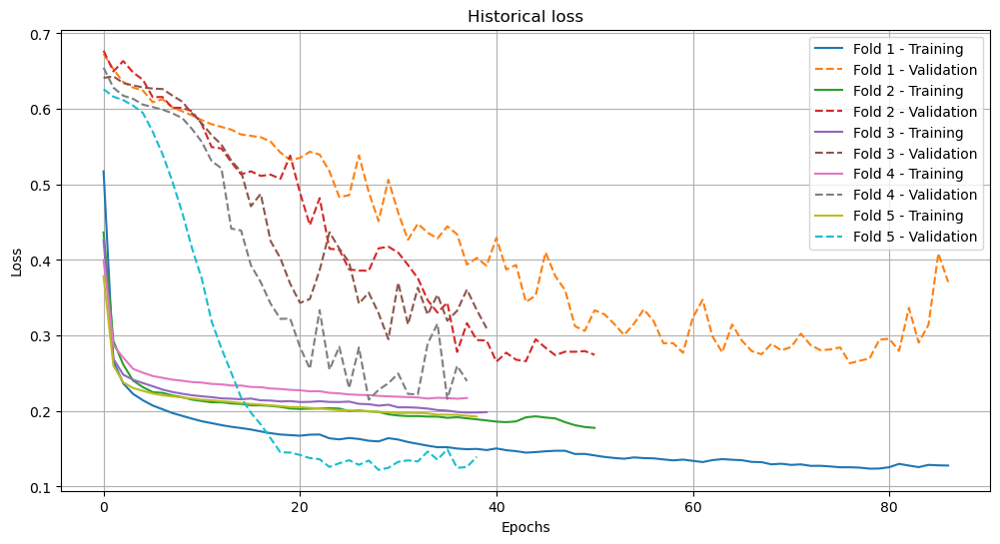

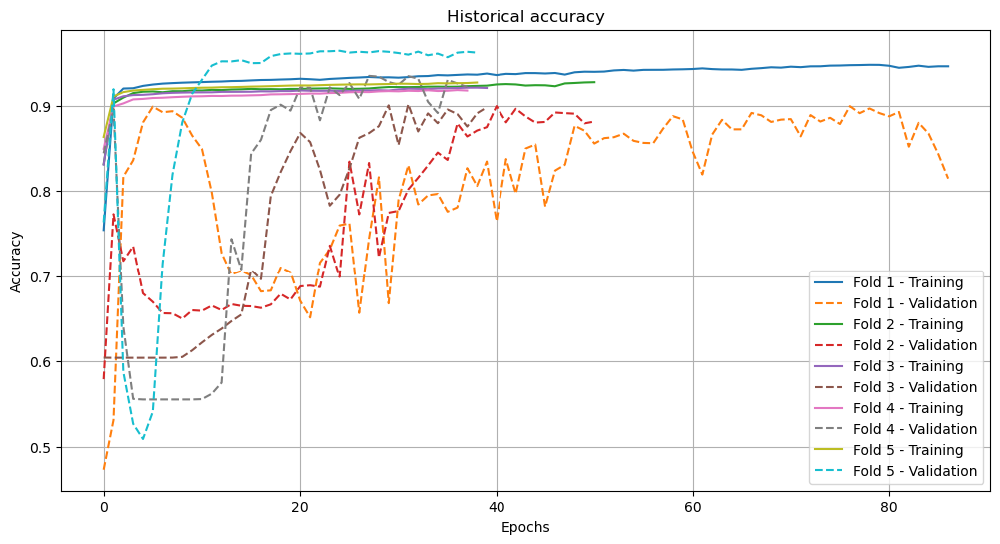

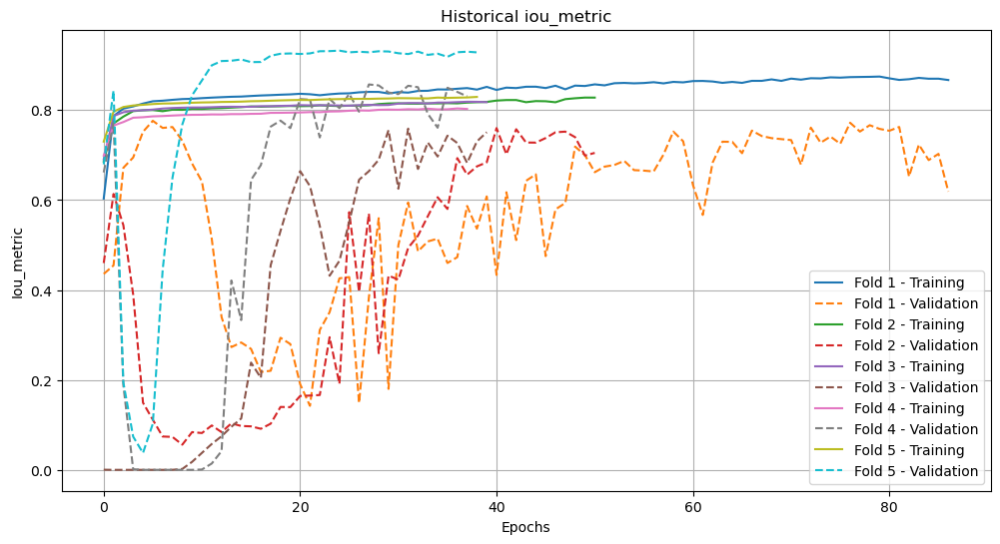

In [26]:
import matplotlib.pyplot as plt

# Função para plotar gráficos de histórico
def plot_histories(histories, metric):
    plt.figure(figsize=(12, 6))
    for i, history in enumerate(histories):
        plt.plot(history[metric], label=f'Fold {i+1} - Training')
        plt.plot(history[f'val_{metric}'], label=f'Fold {i+1} - Validation', linestyle='--')
    plt.title(f'Historical {metric}')
    plt.xlabel('Epochs')
    plt.ylabel(metric.capitalize())
    plt.legend()
    plt.grid(True)
    plt.show()

# Plotar gráficos para Loss, Accuracy e IoU
plot_histories(histories, 'loss')
plot_histories(histories, 'accuracy')
plot_histories(histories, 'iou_metric') 

In [29]:
# One-hot encoding das labels
nbclasses = 2  # Ajuste o número de classes conforme necessário

y_train_onehot = one_hot_encode_labels(patche_classe, nbclasses)

n_bands = 12
# Aplicar a função
X_train_reshaped = reshape_data(patche_cena_reshape, n_bands)

print('Forma de y_train após onehot:', y_train_onehot.shape)
print('Forma de X_train após reshape:', X_train_reshaped.shape)

Forma de y_train após onehot: (958, 64, 64, 2)
Forma de X_train após reshape: (958, 1, 64, 64, 12)


### Rede ConvLSTM

In [21]:
import numpy as np
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import ConvLSTM2D, BatchNormalization, Conv2D
from tensorflow.keras.utils import to_categorical


callbacks = [ModelCheckpoint(path_modelo + '/modelo_drive_{epoch:02d}.keras', verbose=1, save_best_only=True),
             EarlyStopping(monitor='val_loss', patience=10)]
# Função para one-hot encoding
def one_hot_encode_labels(labels, num_classes):
    return to_categorical(labels, num_classes)

# Dimensões
nbclasses = 2  # Número de classes
n_bands = 12
l_patche = 64
input_shape = (1, l_patche, l_patche, n_bands)  # Ajuste conforme necessário

# One-hot encoding das labels
y_train_onehot = one_hot_encode_labels(patche_classe, nbclasses)
print('Forma de y_train após onehot:', y_train_onehot.shape)

# Aplicar a função
X_train_reshaped = reshape_data(patche_cena_reshape, n_bands)
print('Forma de X_train após reshape:', X_train_reshaped.shape)

# Definir o modelo ConvLSTM
def build_conv_lstm_classification_model(input_shape):
    model = Sequential()
    
    # Primeira camada ConvLSTM
    model.add(ConvLSTM2D(filters=64, kernel_size=(3, 3), input_shape=input_shape, padding='same', return_sequences=True))
    model.add(BatchNormalization())
    
    # Segunda camada ConvLSTM
    model.add(ConvLSTM2D(filters=64, kernel_size=(3, 3), padding='same', return_sequences=False))
    model.add(BatchNormalization())
    
    # Camada Conv2D para reduzir para 2 canais (multiclasse por pixel)
    model.add(Conv2D(filters=2, kernel_size=(1, 1), activation='softmax', padding='same'))
    
    model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy', iou_metric])
    return model

# Criar o modelo
model_conv_lstm_classification = build_conv_lstm_classification_model(input_shape)
model_conv_lstm_classification.summary()

# Treinamento
X_train = X_train_reshaped  # (958, 1, 64, 64, 12)
y_train = y_train_onehot  # (958, 64, 64, 2)

print("X_train shape:", X_train.shape)  # Deve ser (958, 1, 64, 64, 12)
print("y_train shape:", y_train.shape)  # Deve ser (958, 64, 64, 2)


# Treinar o modelo
history = model_conv_lstm_classification.fit(X_train, y_train,
                    validation_split=0.2,
                    epochs=100,  # Ajuste o número de épocas conforme necessário
                    batch_size=32,  # Ajuste o tamanho do batch conforme necessário
                    callbacks=callbacks,
                    verbose=1)


Forma de y_train após onehot: (958, 64, 64, 2)
Forma de X_train após reshape: (958, 1, 64, 64, 12)


Model: "sequential_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv_lstm2d_2 (ConvLSTM2D)      │ (None, 1, 64, 64, 64)  │       175,360 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_2           │ (None, 1, 64, 64, 64)  │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv_lstm2d_3 (ConvLSTM2D)      │ (None, 64, 64, 64)     │       295,168 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_3           │ (None, 64, 64, 64)     │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_1 (Conv2D)               │ (None, 64, 64, 2)      │           130 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 471,170 (1.80 MB)

 Trainable params: 470,914 (1.80 MB)

 Non-trainable params: 256 (1.00 KB)

X_train shape: (958, 1, 64, 64, 12)
y_train shape: (958, 64, 64, 2)
Epoch 1/100


I0000 00:00:1732133346.739978  105390 service.cc:146] XLA service 0x565418e286e0 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
I0000 00:00:1732133346.740011  105390 service.cc:154]   StreamExecutor device (0): NVIDIA GeForce RTX 3050 Laptop GPU, Compute Capability 8.6
2024-11-20 17:09:06.796346: I tensorflow/compiler/mlir/tensorflow/utils/dump_mlir_util.cc:268] disabling MLIR crash reproducer, set env var `MLIR_CRASH_REPRODUCER_DIRECTORY` to enable.
2024-11-20 17:09:07.088798: I external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:531] Loaded cuDNN version 8902


 2/24 ━━━━━━━━━━━━━━━━━━━━ 1s 89ms/step - accuracy: 0.6682 - iou_metric: 0.4367 - loss: 0.7823

I0000 00:00:1732133352.009222  105390 device_compiler.h:188] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 294ms/step - accuracy: 0.8288 - iou_metric: 0.6715 - loss: 0.4676
Epoch 1: val_loss improved from inf to 0.65468, saving model to modelos/modelo_drive_01.keras
24/24 ━━━━━━━━━━━━━━━━━━━━ 15s 340ms/step - accuracy: 0.8306 - iou_metric: 0.6740 - loss: 0.4633 - val_accuracy: 0.9177 - val_iou_metric: 0.8352 - val_loss: 0.6547
Epoch 2/100
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/step - accuracy: 0.9032 - iou_metric: 0.7730 - loss: 0.2720
Epoch 2: val_loss improved from 0.65468 to 0.64826, saving model to modelos/modelo_drive_02.keras
24/24 ━━━━━━━━━━━━━━━━━━━━ 2s 96ms/step - accuracy: 0.9033 - iou_metric: 0.7734 - loss: 0.2717 - val_accuracy: 0.5707 - val_iou_metric: 0.1368 - val_loss: 0.6483
Epoch 3/100
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/step - accuracy: 0.9092 - iou_metric: 0.7855 - loss: 0.2584
Epoch 3: val_loss improved from 0.64826 to 0.64250, saving model to modelos/modelo_drive_03.keras
24/24 ━━━━━━━━━━━━━━━━━━━━ 2s 96ms/step - accuracy: 0.9093 - iou_metric: 0

In [22]:
history.history.keys()

dict_keys(['accuracy', 'iou_metric', 'loss', 'val_accuracy', 'val_iou_metric', 'val_loss'])

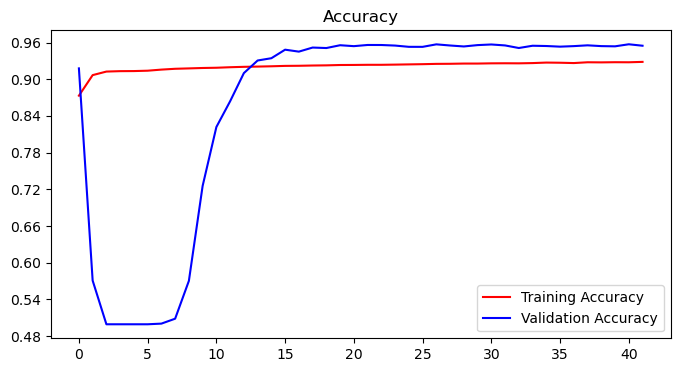

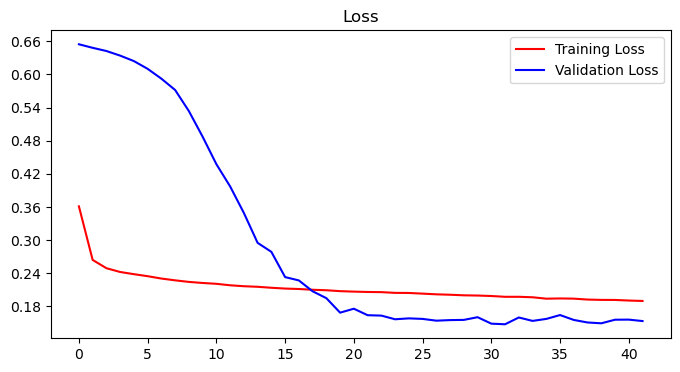

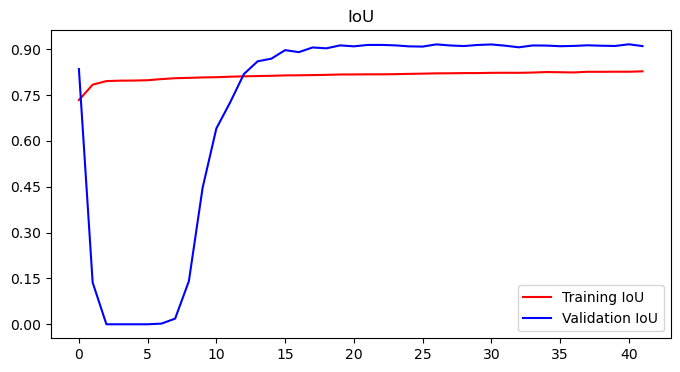

In [23]:

import matplotlib.pyplot as plt
from matplotlib.ticker import MaxNLocator

def plot_acc(history):
    fig = plt.gcf()
    fig.set_size_inches(8, 4)
    plt.subplot(1, 1, 1)
    plt.plot(history.history['accuracy'], 'red', label='Training Accuracy')
    plt.plot(history.history['val_accuracy'], 'blue', label='Validation Accuracy')
    plt.legend()
    plt.title('Accuracy')
    plt.gca().xaxis.set_major_locator(MaxNLocator(integer=True))
    plt.gca().yaxis.set_major_locator(MaxNLocator(integer=True))
    plt.show()

def plot_loss(history):
    fig = plt.gcf()
    fig.set_size_inches(8, 4)
    plt.subplot(1, 1, 1)
    plt.plot(history.history['loss'], 'red', label='Training Loss')
    plt.plot(history.history['val_loss'], 'blue', label='Validation Loss')
    plt.legend()
    plt.title('Loss')
    plt.gca().xaxis.set_major_locator(MaxNLocator(integer=True))
    plt.gca().yaxis.set_major_locator(MaxNLocator(integer=True))
    plt.show()

def plot_iou_metric(history):
    fig = plt.gcf()
    fig.set_size_inches(8, 4)
    plt.subplot(1, 1, 1)
    plt.plot(history.history['iou_metric'], 'red', label='Training IoU')
    plt.plot(history.history['val_iou_metric'], 'blue', label='Validation IoU')
    plt.legend()
    plt.title('IoU')
    plt.gca().xaxis.set_major_locator(MaxNLocator(integer=True))
    plt.gca().yaxis.set_major_locator(MaxNLocator(integer=True))
    plt.show()

plot_acc(history)
plot_loss(history)
plot_iou_metric(history)


In [24]:
# patche_cena_test.shape #640, 64, 64, 12 Deve ser da forma (958, 1, 64, 64, 12
# Aplicar a função
patche_cena_test_reshaped = reshape_data(patche_cena_test, n_bands)
print('Forma de patche_cena_test após reshape:', patche_cena_test_reshaped.shape)

Forma de patche_cena_test após reshape: (640, 1, 64, 64, 12)


In [25]:
# Fazer a predição
y_pred = model_conv_lstm_classification.predict(patche_cena_test_reshaped)

# Se for uma tarefa de classificação, usar argmax para obter as classes previstas
y_pred_argmax = np.argmax(y_pred, axis=-1)  # Para tarefas multi-classes

20/20 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step


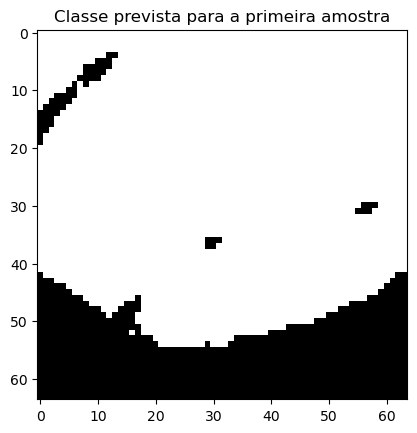

In [26]:
import matplotlib.pyplot as plt

# Plotar a predição para a primeira amostra
plt.imshow(y_pred_argmax[639], cmap='gray')
plt.title('Classe prevista para a primeira amostra')
plt.show()

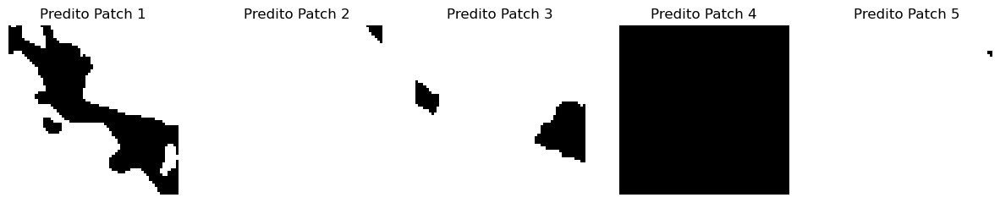

In [27]:
# Número de patches para exibir
num_patches = 5

# Criar o layout
fig, axes = plt.subplots(1, num_patches, figsize=(15, 15))

# Visualizar os primeiros 5 patches preditos
for i in range(num_patches):
    axes[i].imshow(y_pred_argmax[i], cmap='gray')
    axes[i].set_title(f'Predito Patch {i+1}')
    axes[i].axis('off')

plt.show()

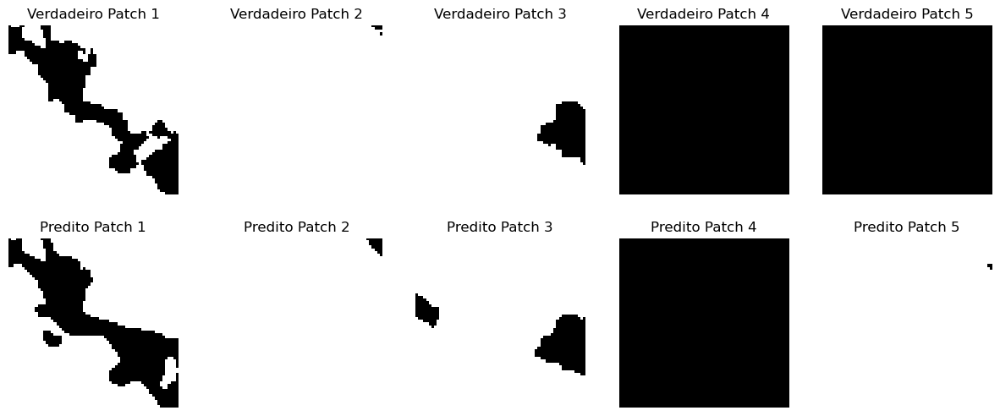

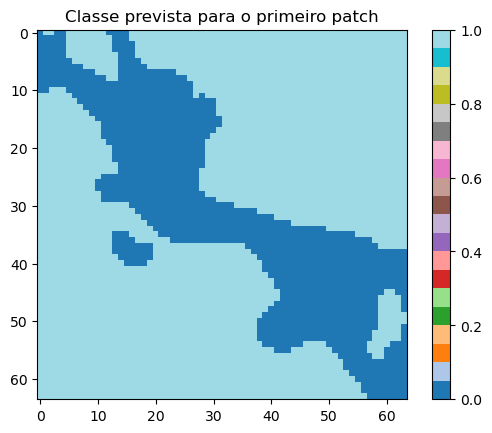

In [28]:
# Número de patches para comparar
num_patches = 5

# Criar layout para comparação
fig, axes = plt.subplots(2, num_patches, figsize=(15, 6))

# Exibir os patches verdadeiros (linhas de cima)
for i in range(num_patches):
    axes[0, i].imshow(patche_classe_test[i], cmap='gray')
    axes[0, i].set_title(f'Verdadeiro Patch {i+1}')
    axes[0, i].axis('off')

# Exibir os patches preditos (linhas de baixo)
for i in range(num_patches):
    axes[1, i].imshow(y_pred_argmax[i], cmap='gray')
    axes[1, i].set_title(f'Predito Patch {i+1}')
    axes[1, i].axis('off')

plt.show()

plt.imshow(y_pred_argmax[0], cmap='tab20')  # Usar um colormap diferente para múltiplas classes
plt.title('Classe prevista para o primeiro patch')
plt.colorbar()
plt.show()

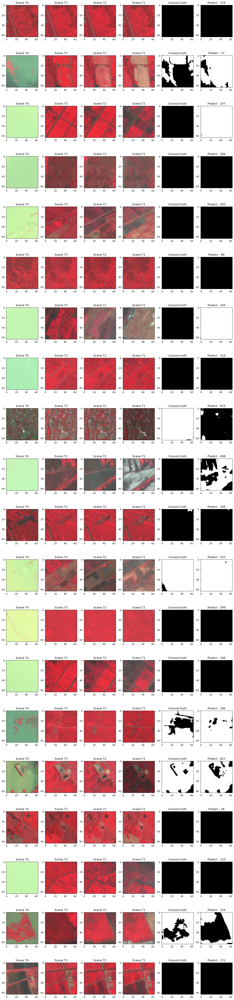

In [29]:
import matplotlib.pyplot as plt
import numpy as np


# Função para visualização das imagens
def visualize_images(num_rows, random_indices):
    fig, axes = plt.subplots(num_rows, 6, figsize=(14, 3*num_rows))

    for i in range(num_rows):
        idx = random_indices[i]

        # # Stack BGR NIR to RGB NIR - 12 channels -> 3 channels
        image_rgb_t1 = np.stack([patche_cena_test[idx, :, :, 11], patche_cena_test[idx, :, :, 10],
                                 patche_cena_test[idx, :, :, 9]], axis=2)
        
        image_rgb_t2 = np.stack([patche_cena_test[idx, :, :, 8], patche_cena_test[idx, :, :, 7],
                                 patche_cena_test[idx, :, :, 6]], axis=2)

        image_rgb_t3 = np.stack([patche_cena_test[idx, :, :, 5], patche_cena_test[idx, :, :, 4],
                                 patche_cena_test[idx, :, :, 3]], axis=2)

        image_rgb_t4 = np.stack([patche_cena_test[idx, :, :, 2], patche_cena_test[idx, :, :, 1],
                                 patche_cena_test[idx, :, :, 0]], axis=2)

        # Normalização das imagens RGB
        image_rgb_t1 = image_rgb_t1 / image_rgb_t1.max()
        image_rgb_t2 = image_rgb_t2 / image_rgb_t2.max()
        image_rgb_t3 = image_rgb_t3 / image_rgb_t3.max()
        image_rgb_t4 = image_rgb_t4 / image_rgb_t4.max()

        # Predições
        ground_truth = np.squeeze(patche_classe_test[idx])
        predict = np.squeeze(y_pred_argmax[idx])

        # Plotar as imagens
        axes[i, 0].imshow(image_rgb_t4, cmap='gray')
        axes[i, 0].set_title('Scene T4')
        # axes[i, 0].axis('off')

        axes[i, 1].imshow(image_rgb_t3, cmap='gray')
        axes[i, 1].set_title('Scene T3')
        # axes[i, 1].axis('off')

        axes[i, 2].imshow(image_rgb_t2, cmap='gray')
        axes[i, 2].set_title('Scene T2')
        # axes[i, 0].axis('off')

        axes[i, 3].imshow(image_rgb_t1, cmap='gray')
        axes[i, 3].set_title('Scene T1')
        # axes[i, 0].axis('off')

        axes[i, 4].imshow(ground_truth, cmap='gray')
        axes[i, 4].set_title('Ground truth')
        # axes[i, 2].axis('off')

        axes[i, 5].imshow(predict, cmap='gray')
        axes[i, 5].set_title(f'Predict - {idx}')
        # axes[i, 3].axis('off')

    plt.tight_layout()
    plt.show()

# Escolha aleatoriamente algumas imagens para visualizar
num_samples = 20
random_indices = np.random.randint(0, patche_cena_test.shape[0], num_samples)

# Visualizar as cenas e as classes lado a lado
visualize_images(num_samples, random_indices)

In [30]:
# Delete variáveis
# del patche_cena, patche_classe, patche_cena_, patche_cena_augmented, patche_classe_augmented, patche_cena_combined, patche_classe_combined

## 7: F1-Score e Acurácia do Teste

In [31]:
# Teste separando patchs e labels do dataset
# F1-Score:
f1 = f1_score(list(patche_classe_test.flatten()), list(y_pred_argmax.flatten()), average='weighted')
print("F1-Score: ", f1)

# Accuracy:
acc = accuracy_score(list(patche_classe_test.flatten()), list(y_pred_argmax.flatten()))
print("Accuracy: ", acc)

F1-Score:  0.9298006126948902
Accuracy:  0.9294509887695312


## 8: Métrica IoU [2]

Text(0.5, 1.0, 'Máscara real')

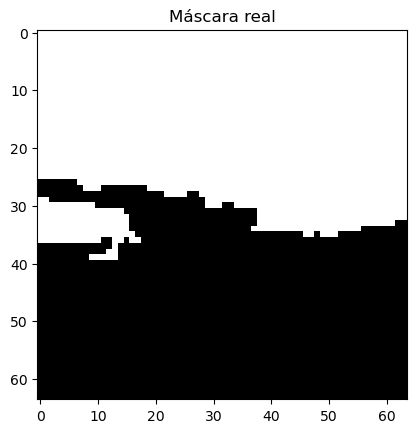

In [32]:
id_img_teste = 120
img_teste = patche_cena_test[id_img_teste]
ground_truth = patche_classe_test[id_img_teste]
plt.imshow(np.squeeze(ground_truth), cmap='gray')
plt.title('Máscara real')

In [33]:
from tensorflow.keras.metrics import MeanIoU
iou_resultado = MeanIoU(num_classes = 2)

In [34]:
img_teste.shape

(64, 64, 12)

In [35]:
img_teste_expanded = img_teste.reshape(1, 64, 64, n_bands)
print(img_teste_expanded.shape)

(1, 64, 64, 12)


In [36]:
# Ajustar a forma da imagem para (1, 1, 64, 64, 12) - incluindo a dimensão temporal
img_teste_expanded = np.expand_dims(img_teste, axis=0)  # Forma: (1, 64, 64, 12)
img_teste_expanded = np.expand_dims(img_teste_expanded, axis=0)  # Forma: (1, 1, 64, 64, 12)

# Verificar a forma da imagem expandida
print("Forma da imagem de teste expandida:", img_teste_expanded.shape)

# Realizar a predição
try:
    predictions = model_conv_lstm_classification.predict(img_teste_expanded)  # Forma: (1, 64, 64, num_classes)
except Exception as e:
    print("Erro ao realizar a predição:", e)
    raise


Forma da imagem de teste expandida: (1, 1, 64, 64, 12)
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 793ms/step


In [37]:
predictions = tf.argmax(predictions, axis=-1)

In [38]:
ground_truth = ground_truth.reshape(1, 64, 64, 1)

In [39]:
ground_truth = tf.cast(ground_truth, tf.int64)

In [40]:
iou_resultado.update_state(ground_truth, predictions)
iou = iou_resultado.result()

In [41]:
ground_truth.shape, predictions.shape #(TensorShape([1, 64, 64, 1]), TensorShape([1, 1, 64, 64]))

(TensorShape([1, 64, 64, 1]), TensorShape([1, 64, 64]))

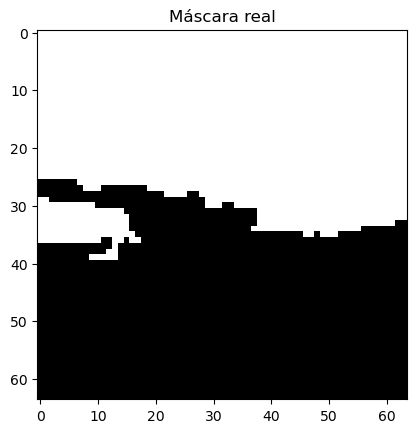

Forma da imagem de teste expandida: (1, 1, 64, 64, 12)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
(1, 64, 64)
(64, 64)


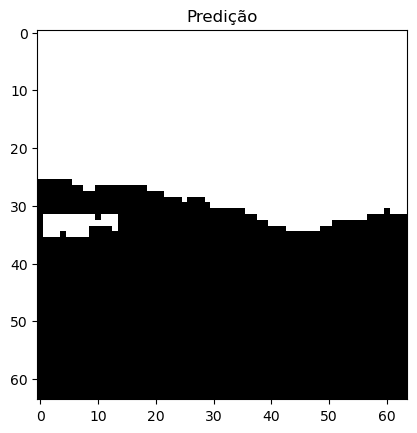

IoU: 0.9416911602020264


In [42]:
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf
from tensorflow.keras.metrics import MeanIoU

# Selecionar a imagem de teste
id_img_teste = 120
img_teste = patche_cena_test[id_img_teste]  # Forma: (64, 64, 12)
ground_truth = patche_classe_test[id_img_teste]  # Forma: (64, 64)

# Visualizar a máscara real
plt.imshow(np.squeeze(ground_truth), cmap='gray')
plt.title('Máscara real')
plt.show()

# Expandir as dimensões da imagem de teste para o formato esperado pelo modelo
img_teste_expanded = np.expand_dims(img_teste, axis=0)  # Forma: (1, 64, 64, 12)
img_teste_expanded = np.expand_dims(img_teste_expanded, axis=0)  # Forma: (1, 1, 64, 64, 12)

# Verificar a forma da imagem expandida
print("Forma da imagem de teste expandida:", img_teste_expanded.shape)

# Realizar a predição
try:
    predictions = model_conv_lstm_classification.predict(img_teste_expanded)  # Forma: (1, 64, 64, num_classes)
except Exception as e:
    print("Erro ao realizar a predição:", e)
    raise

# Converter as predições para rótulos de classe
# Converter as predições para rótulos de classe
predictions = np.argmax(predictions, axis=-1)  # Forma: (1, 64, 64)
print(predictions.shape)
predictions = np.squeeze(predictions, axis=0)  # Forma: (64, 64)
# predictions = np.squeeze(predictions, axis=0)  # Forma: (64, 64)
print(predictions.shape)

# Visualizar a predição
plt.imshow(predictions, cmap='gray')
plt.title('Predição')
plt.show()


# Inicializar e calcular o IoU
iou_metric = MeanIoU(num_classes=2)
ground_truth = np.expand_dims(ground_truth, axis=-1)  # Forma: (64, 64, 1)
iou_metric.update_state(ground_truth, predictions)
iou_resultado = iou_metric.result().numpy()
print(f'IoU: {iou_resultado}')

In [43]:
iou_resultado = MeanIoU(num_classes=2)
iou_resultado.update_state(ground_truth, predictions)
iou = iou_resultado.result().numpy()
print('IoU para a imagem:', iou)

IoU para a imagem: 0.94169116


In [44]:
import pandas as pd
import numpy as np
import tensorflow as tf
from tensorflow.keras.metrics import MeanIoU

def calcular_iou(id_img_teste, model, patche_cena_test, patche_classe_test):
    img_teste = patche_cena_test[id_img_teste]
    ground_truth = patche_classe_test[id_img_teste]

    iou_resultado = MeanIoU(num_classes=2)

    img_test = np.expand_dims(img_teste, axis=0)  
    img_test = np.expand_dims(img_test, axis=0)  
    predictions = model.predict(img_test)
    predictions = tf.argmax(predictions, axis=-1)

    ground_truth = ground_truth.reshape(1, 64, 64, 1)
    ground_truth = tf.cast(ground_truth, tf.int64)

    iou_resultado.update_state(ground_truth, predictions)
    iou = iou_resultado.result()

    # fig, axs = plt.subplots(1, 2, figsize=(10, 5))

    # axs[0].imshow(np.squeeze(ground_truth), cmap='gray')
    # axs[0].set_title('Máscara real')

    # axs[1].imshow(predictions[0], cmap='gray')
    # axs[1].set_title('Predição')

    # plt.show()

    print(f'IoU para a imagem {id_img_teste}: {iou}')

    return iou

def calcular_media_iou(model, patche_cena_test, patche_classe_test):
    valores_iou = []
    for id_img_teste in range(len(patche_cena_test)):
        iou = calcular_iou(id_img_teste, model, patche_cena_test, patche_classe_test)
        valores_iou.append(iou)

    media_iou = np.mean(valores_iou)
    print(f'Média do IoU para todas as imagens: {media_iou}')

calcular_media_iou(model_conv_lstm_classification, patche_cena_test, patche_classe_test)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
IoU para a imagem 0: 0.8038808107376099
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
IoU para a imagem 1: 0.6516445875167847
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
IoU para a imagem 2: 0.8551709651947021
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
IoU para a imagem 3: 0.9999998807907104
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
IoU para a imagem 4: 0.4996337890625
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
IoU para a imagem 5: 0.9999998807907104
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
IoU para a imagem 6: 0.9753191471099854
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
IoU para a imagem 7: 0.926633358001709
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
IoU para a imagem 8: 0.7313026785850525
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
IoU para a imagem 9: 0.5930395126342773
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
IoU para a imagem 10: 0.9541668891906738
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
IoU para a imagem 11: 0.8186783790588379
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
IoU para a imagem 12: 0.6339

## 9: Carregar o modelos cross validation (k=5)

In [55]:
from tensorflow.keras.utils import CustomObjectScope
from tensorflow.keras.models import load_model

- model_fold_1

In [56]:
# model_fold_1
model = load_model('model_fold_1.keras')
model.load_weights('model_fold_1.keras')

In [57]:
# Predição
y_pred = model.predict(patche_cena_test_reshaped)
y_pred_argmax = np.argmax(y_pred, axis=-1)  # Predições em termos de classe

20/20 ━━━━━━━━━━━━━━━━━━━━ 1s 48ms/step


In [58]:
# Teste separando patchs e labels do dataset
# F1-Score:
f1 = f1_score(list(patche_classe_test.flatten()), list(y_pred_argmax.flatten()), average='weighted')
print("F1-Score: ", f1)

# Accuracy:
acc = accuracy_score(list(patche_classe_test.flatten()), list(y_pred_argmax.flatten()))
print("Accuracy: ", acc)

F1-Score:  0.9294154848277077
Accuracy:  0.9287700653076172


In [59]:
def calcular_iou(id_img_teste, model, patche_cena_test, patche_classe_test):
    img_teste = patche_cena_test[id_img_teste]
    ground_truth = patche_classe_test[id_img_teste]

    iou_resultado = MeanIoU(num_classes=2)

    img_test = np.expand_dims(img_teste, axis=0)  
    img_test = np.expand_dims(img_test, axis=0)  
    predictions = model.predict(img_test)
    predictions = tf.argmax(predictions, axis=-1)

    ground_truth = ground_truth.reshape(1, 64, 64, 1)
    ground_truth = tf.cast(ground_truth, tf.int64)

    iou_resultado.update_state(ground_truth, predictions)
    iou = iou_resultado.result()

    # fig, axs = plt.subplots(1, 2, figsize=(10, 5))

    # axs[0].imshow(np.squeeze(ground_truth), cmap='gray')
    # axs[0].set_title('Máscara real')

    # axs[1].imshow(predictions[0], cmap='gray')
    # axs[1].set_title('Predição')

    # plt.show()

    print(f'IoU para a imagem {id_img_teste}: {iou}')

    return iou

def calcular_media_iou(model, patche_cena_test, patche_classe_test):
    valores_iou = []
    for id_img_teste in range(len(patche_cena_test)):
        iou = calcular_iou(id_img_teste, model, patche_cena_test, patche_classe_test)
        valores_iou.append(iou)

    media_iou = np.mean(valores_iou)
    print(f'Média do IoU para todas as imagens: {media_iou}')

calcular_media_iou(model, patche_cena_test, patche_classe_test)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 369ms/step
IoU para a imagem 0: 0.7638388872146606
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
IoU para a imagem 1: 0.6262191534042358
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
IoU para a imagem 2: 0.7578665018081665
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
IoU para a imagem 3: 0.4998779296875
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
IoU para a imagem 4: 0.499755859375
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
IoU para a imagem 5: 0.4993896484375
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
IoU para a imagem 6: 0.9706108570098877
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
IoU para a imagem 7: 0.9219832420349121
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
IoU para a imagem 8: 0.6784506440162659
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
IoU para a imagem 9: 0.5361352562904358
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
IoU para a imagem 10: 0.8985366821289062
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
IoU para a imagem 11: 0.8699091076850891
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
IoU para a imagem 12: 0.601557672

- model_fold_2

In [60]:
# model_fold_2
model = load_model('model_fold_2.keras')
model.load_weights('model_fold_2.keras')

In [61]:
# Predição
y_pred = model.predict(patche_cena_test_reshaped)
y_pred_argmax = np.argmax(y_pred, axis=-1)  # Predições em termos de classe

20/20 ━━━━━━━━━━━━━━━━━━━━ 1s 48ms/step


In [62]:
# Teste separando patchs e labels do dataset
# F1-Score:
f1 = f1_score(list(patche_classe_test.flatten()), list(y_pred_argmax.flatten()), average='weighted')
print("F1-Score: ", f1)

# Accuracy:
acc = accuracy_score(list(patche_classe_test.flatten()), list(y_pred_argmax.flatten()))
print("Accuracy: ", acc)

F1-Score:  0.917444136510937
Accuracy:  0.916781234741211


In [63]:
def calcular_iou(id_img_teste, model, patche_cena_test, patche_classe_test):
    img_teste = patche_cena_test[id_img_teste]
    ground_truth = patche_classe_test[id_img_teste]

    iou_resultado = MeanIoU(num_classes=2)

    img_test = np.expand_dims(img_teste, axis=0)  
    img_test = np.expand_dims(img_test, axis=0)  
    predictions = model.predict(img_test)
    predictions = tf.argmax(predictions, axis=-1)

    ground_truth = ground_truth.reshape(1, 64, 64, 1)
    ground_truth = tf.cast(ground_truth, tf.int64)

    iou_resultado.update_state(ground_truth, predictions)
    iou = iou_resultado.result()

    # fig, axs = plt.subplots(1, 2, figsize=(10, 5))

    # axs[0].imshow(np.squeeze(ground_truth), cmap='gray')
    # axs[0].set_title('Máscara real')

    # axs[1].imshow(predictions[0], cmap='gray')
    # axs[1].set_title('Predição')

    # plt.show()

    print(f'IoU para a imagem {id_img_teste}: {iou}')

    return iou

def calcular_media_iou(model, patche_cena_test, patche_classe_test):
    valores_iou = []
    for id_img_teste in range(len(patche_cena_test)):
        iou = calcular_iou(id_img_teste, model, patche_cena_test, patche_classe_test)
        valores_iou.append(iou)

    media_iou = np.mean(valores_iou)
    print(f'Média do IoU para todas as imagens: {media_iou}')

calcular_media_iou(model, patche_cena_test, patche_classe_test)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 361ms/step
IoU para a imagem 0: 0.8018201589584351
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
IoU para a imagem 1: 0.6579207181930542
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
IoU para a imagem 2: 0.8547537326812744
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
IoU para a imagem 3: 0.9999998807907104
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
IoU para a imagem 4: 0.499755859375
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
IoU para a imagem 5: 0.4998779296875
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
IoU para a imagem 6: 0.9746904373168945
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
IoU para a imagem 7: 0.8816149830818176
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
IoU para a imagem 8: 0.7099535465240479
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
IoU para a imagem 9: 0.6065969467163086
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
IoU para a imagem 10: 0.963763952255249
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
IoU para a imagem 11: 0.824626088142395
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
IoU para a imagem 12: 0.62565469

- model_fold_3

In [64]:
# model_fold_3
model = load_model('model_fold_3.keras')
model.load_weights('model_fold_3.keras')

In [65]:
# Predição
y_pred = model.predict(patche_cena_test_reshaped)
y_pred_argmax = np.argmax(y_pred, axis=-1)  # Predições em termos de classe

20/20 ━━━━━━━━━━━━━━━━━━━━ 1s 49ms/step


In [66]:
# Teste separando patchs e labels do dataset
# F1-Score:
f1 = f1_score(list(patche_classe_test.flatten()), list(y_pred_argmax.flatten()), average='weighted')
print("F1-Score: ", f1)

# Accuracy:
acc = accuracy_score(list(patche_classe_test.flatten()), list(y_pred_argmax.flatten()))
print("Accuracy: ", acc)

F1-Score:  0.9175846402611016
Accuracy:  0.9174182891845704


In [67]:
def calcular_iou(id_img_teste, model, patche_cena_test, patche_classe_test):
    img_teste = patche_cena_test[id_img_teste]
    ground_truth = patche_classe_test[id_img_teste]

    iou_resultado = MeanIoU(num_classes=2)

    img_test = np.expand_dims(img_teste, axis=0)  
    img_test = np.expand_dims(img_test, axis=0)  
    predictions = model.predict(img_test)
    predictions = tf.argmax(predictions, axis=-1)

    ground_truth = ground_truth.reshape(1, 64, 64, 1)
    ground_truth = tf.cast(ground_truth, tf.int64)

    iou_resultado.update_state(ground_truth, predictions)
    iou = iou_resultado.result()

    # fig, axs = plt.subplots(1, 2, figsize=(10, 5))

    # axs[0].imshow(np.squeeze(ground_truth), cmap='gray')
    # axs[0].set_title('Máscara real')

    # axs[1].imshow(predictions[0], cmap='gray')
    # axs[1].set_title('Predição')

    # plt.show()

    print(f'IoU para a imagem {id_img_teste}: {iou}')

    return iou

def calcular_media_iou(model, patche_cena_test, patche_classe_test):
    valores_iou = []
    for id_img_teste in range(len(patche_cena_test)):
        iou = calcular_iou(id_img_teste, model, patche_cena_test, patche_classe_test)
        valores_iou.append(iou)

    media_iou = np.mean(valores_iou)
    print(f'Média do IoU para todas as imagens: {media_iou}')

calcular_media_iou(model, patche_cena_test, patche_classe_test)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 383ms/step
IoU para a imagem 0: 0.7691878080368042
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
IoU para a imagem 1: 0.6888861656188965
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
IoU para a imagem 2: 0.8621971607208252
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
IoU para a imagem 3: 0.9999998807907104
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
IoU para a imagem 4: 0.9999998807907104
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
IoU para a imagem 5: 0.9999998807907104
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
IoU para a imagem 6: 0.9789563417434692
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
IoU para a imagem 7: 0.9248161315917969
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
IoU para a imagem 8: 0.7224278450012207
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
IoU para a imagem 9: 0.5660883188247681
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
IoU para a imagem 10: 0.9431372880935669
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
IoU para a imagem 11: 0.8554331064224243
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
IoU para a imagem 12: 0

- model_fold_4

In [68]:
# model_fold_4
model = load_model('model_fold_4.keras')
model.load_weights('model_fold_4.keras')

In [69]:
# Predição
y_pred = model.predict(patche_cena_test_reshaped)
y_pred_argmax = np.argmax(y_pred, axis=-1)  # Predições em termos de classe

20/20 ━━━━━━━━━━━━━━━━━━━━ 1s 49ms/step


In [70]:
# Teste separando patchs e labels do dataset
# F1-Score:
f1 = f1_score(list(patche_classe_test.flatten()), list(y_pred_argmax.flatten()), average='weighted')
print("F1-Score: ", f1)

# Accuracy:
acc = accuracy_score(list(patche_classe_test.flatten()), list(y_pred_argmax.flatten()))
print("Accuracy: ", acc)

F1-Score:  0.9238378647385981
Accuracy:  0.9238380432128906


In [71]:
def calcular_iou(id_img_teste, model, patche_cena_test, patche_classe_test):
    img_teste = patche_cena_test[id_img_teste]
    ground_truth = patche_classe_test[id_img_teste]

    iou_resultado = MeanIoU(num_classes=2)

    img_test = np.expand_dims(img_teste, axis=0)  
    img_test = np.expand_dims(img_test, axis=0)  
    predictions = model.predict(img_test)
    predictions = tf.argmax(predictions, axis=-1)

    ground_truth = ground_truth.reshape(1, 64, 64, 1)
    ground_truth = tf.cast(ground_truth, tf.int64)

    iou_resultado.update_state(ground_truth, predictions)
    iou = iou_resultado.result()

    # fig, axs = plt.subplots(1, 2, figsize=(10, 5))

    # axs[0].imshow(np.squeeze(ground_truth), cmap='gray')
    # axs[0].set_title('Máscara real')

    # axs[1].imshow(predictions[0], cmap='gray')
    # axs[1].set_title('Predição')

    # plt.show()

    print(f'IoU para a imagem {id_img_teste}: {iou}')

    return iou

def calcular_media_iou(model, patche_cena_test, patche_classe_test):
    valores_iou = []
    for id_img_teste in range(len(patche_cena_test)):
        iou = calcular_iou(id_img_teste, model, patche_cena_test, patche_classe_test)
        valores_iou.append(iou)

    media_iou = np.mean(valores_iou)
    print(f'Média do IoU para todas as imagens: {media_iou}')

calcular_media_iou(model, patche_cena_test, patche_classe_test)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 371ms/step
IoU para a imagem 0: 0.768044650554657
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
IoU para a imagem 1: 0.6579207181930542
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
IoU para a imagem 2: 0.8548132181167603
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
IoU para a imagem 3: 0.9999998807907104
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
IoU para a imagem 4: 0.4998779296875
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
IoU para a imagem 5: 0.9999998807907104
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
IoU para a imagem 6: 0.9779495000839233
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
IoU para a imagem 7: 0.9214175939559937
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
IoU para a imagem 8: 0.72019362449646
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
IoU para a imagem 9: 0.5661599040031433
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
IoU para a imagem 10: 0.9241111278533936
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
IoU para a imagem 11: 0.8291047811508179
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
IoU para a imagem 12: 0.63137

- model_fold_5

In [72]:
# model_fold_5
model = load_model('model_fold_5.keras')
model.load_weights('model_fold_5.keras')

In [73]:
# Predição
y_pred = model.predict(patche_cena_test_reshaped)
y_pred_argmax = np.argmax(y_pred, axis=-1)  # Predições em termos de classe

20/20 ━━━━━━━━━━━━━━━━━━━━ 1s 50ms/step


In [74]:
# Teste separando patchs e labels do dataset
# F1-Score:
f1 = f1_score(list(patche_classe_test.flatten()), list(y_pred_argmax.flatten()), average='weighted')
print("F1-Score: ", f1)

# Accuracy:
acc = accuracy_score(list(patche_classe_test.flatten()), list(y_pred_argmax.flatten()))
print("Accuracy: ", acc)

F1-Score:  0.9355289740440755
Accuracy:  0.9354713439941407


In [75]:
def calcular_iou(id_img_teste, model, patche_cena_test, patche_classe_test):
    img_teste = patche_cena_test[id_img_teste]
    ground_truth = patche_classe_test[id_img_teste]

    iou_resultado = MeanIoU(num_classes=2)

    img_test = np.expand_dims(img_teste, axis=0)  
    img_test = np.expand_dims(img_test, axis=0)  
    predictions = model.predict(img_test)
    predictions = tf.argmax(predictions, axis=-1)

    ground_truth = ground_truth.reshape(1, 64, 64, 1)
    ground_truth = tf.cast(ground_truth, tf.int64)

    iou_resultado.update_state(ground_truth, predictions)
    iou = iou_resultado.result()

    # fig, axs = plt.subplots(1, 2, figsize=(10, 5))

    # axs[0].imshow(np.squeeze(ground_truth), cmap='gray')
    # axs[0].set_title('Máscara real')

    # axs[1].imshow(predictions[0], cmap='gray')
    # axs[1].set_title('Predição')

    # plt.show()

    print(f'IoU para a imagem {id_img_teste}: {iou}')

    return iou

def calcular_media_iou(model, patche_cena_test, patche_classe_test):
    valores_iou = []
    for id_img_teste in range(len(patche_cena_test)):
        iou = calcular_iou(id_img_teste, model, patche_cena_test, patche_classe_test)
        valores_iou.append(iou)

    media_iou = np.mean(valores_iou)
    print(f'Média do IoU para todas as imagens: {media_iou}')

calcular_media_iou(model, patche_cena_test, patche_classe_test)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 391ms/step
IoU para a imagem 0: 0.8096840977668762
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
IoU para a imagem 1: 0.6516445875167847
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
IoU para a imagem 2: 0.8635177612304688
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
IoU para a imagem 3: 0.9999998807907104
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
IoU para a imagem 4: 0.9999998807907104
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
IoU para a imagem 5: 0.9999998807907104
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
IoU para a imagem 6: 0.9764395952224731
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
IoU para a imagem 7: 0.9306749105453491
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
IoU para a imagem 8: 0.7413234710693359
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
IoU para a imagem 9: 0.5689619779586792
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
IoU para a imagem 10: 0.9600780010223389
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
IoU para a imagem 11: 0.8346935510635376
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
IoU para a imagem 12: 0

- média e desvio padrão

In [78]:
import numpy as np

#1
f1_1 = 0.9294154848277077
acc_1 = 0.9287700653076172
iou_1 = 0.6744562983512878

f1_2 = 0.917444136510937
acc_2 = 0.916781234741211
iou_2 = 0.7073254585266113

f1_3 = 0.9175846402611016
acc_3 = 0.9174182891845704
iou_3 = 0.7257897257804871

f1_4 = 0.9238378647385981
acc_4 = 0.9238380432128906
iou_4 = 0.7178009748458862

f1_5 = 0.9355289740440755
acc_5 = 0.9354713439941407
iou_5 = 0.7494389414787292
# Valores das métricas obtidas pelos modelos gerados em cross validation
f1_scores = [f1_1,f1_2,f1_3,f1_4,f1_5]
accuracies = [acc_1,acc_2,acc_3,acc_4,acc_5]
ious = [iou_1,iou_2,iou_3,iou_4,iou_5]

In [79]:
# Cálculo da média e desvio padrão
f1_mean = np.mean(f1_scores)
f1_std = np.std(f1_scores)

accuracy_mean = np.mean(accuracies)
accuracy_std = np.std(accuracies)

iou_mean = np.mean(ious)
iou_std = np.std(ious)

# Cálculos intermediários para F1-Score
f1_diffs = (np.array(f1_scores) - f1_mean)**2
f1_variance = np.mean(f1_diffs)
f1_std_calculated = np.sqrt(f1_variance)

# Cálculos intermediários para Accuracy
accuracy_diffs = (np.array(accuracies) - accuracy_mean)**2
accuracy_variance = np.mean(accuracy_diffs)
accuracy_std_calculated = np.sqrt(accuracy_variance)

# Cálculos intermediários para IoU
iou_diffs = (np.array(ious) - iou_mean)**2
iou_variance = np.mean(iou_diffs)
iou_std_calculated = np.sqrt(iou_variance)

# Exibir os resultados
print(f'F1-Score: Média={f1_mean}, Desvio Padrão={f1_std}')
print(f'Accuracy: Média={accuracy_mean}, Desvio Padrão={accuracy_std}')
print(f'IoU: Média={iou_mean}, Desvio Padrão={iou_std}')

F1-Score: Média=0.9247622200764839, Desvio Padrão=0.006978571425626027
Accuracy: Média=0.9244557952880859, Desvio Padrão=0.007053541358324441
IoU: Média=0.7149622797966003, Desvio Padrão=0.024547861612851565



























































































































































































































































































































































































































































































































## 10: Conclusão
### A avaliação dos resultados foi melhor compreendida com a convergência do modelo de treinamento e a vizualização das segmentações dos rótudos feitas pelo algoritmo, juntamente com o método IoU (*Intersection Over Union*), foi possível visualizar a melhora das predições com os rótulos verdadeiros do conjunto de teste, portanto generalizados. Em trabalhos futuros deverá ser realizado comparações com arquiteturas de modelos que implemente redes Convolucionais e Recorrentes conectadas. Além disso, o processamento das imagens bitemporais deverão ser mais precisas, com registro (sem deslocamento) e um melhor segmento das máscaras de deslizamentos, considerando os mapas do site *Charter* [6] como verdade de campo, e uma melhor segmentação vetorizada pela biblioteca RSGISLib [7].

## Referências

  - [1] [Notebook WorkCAP Hackathon 2022](https://www.kaggle.com/code/grupohackaton2022/hackathon-notebook)
  - [2] [Python for Geosciences: Raster Merging, Clipping and Reprojection with Rasterio](https://medium.com/analytics-vidhya/python-for-geosciences-raster-merging-clipping-and-reprojection-with-rasterio-9f05f012b88a)
  - [3] [Patch Generator](https://github.com/vdlucas-queiroz/patch_generator/)
  - [4] [TensorFlow/Keras](https://www.tensorflow.org/api_docs/python/tf/keras/losses/SparseCategoricalCrossentropy)
  - [5] [Segmentação de Imagens com Python de A a Z](https://iaexpert.academy/cursos-online-assinatura/segmentacao-imagens-python-a-z/)
  - [6] [The International Charter Space and Major Disasters](https://disasterscharter.org/web/guest/activations/-/article/landslide-in-brazil-activation-758-)
  - [7] [RSGISLib Image Segmentation Module](http://rsgislib.org/rsgislib_segmentation.html)